In [1038]:
import warnings
warnings.filterwarnings("ignore")

In [2499]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator
import plotly.graph_objects as go

import re
from datetime import datetime, timedelta
import json
from scipy.stats import randint, uniform, loguniform

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, RandomizedSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, mean_absolute_error, mean_absolute_percentage_error, r2_score, mean_squared_error, root_mean_squared_error
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import NearestNeighbors
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge, RidgeCV

In [1150]:
RANDOM_STATE = 42

In [1152]:
sample1 = pd.read_csv("auto_precise-2.csv")
sample2 = pd.read_csv("clothes_precise-4.csv")
sample3 = pd.read_csv("clothes_precise.csv")
sample4 = pd.read_csv("pets_precise.csv")
sample5 = pd.read_csv("realty_precise-2.csv")
sample6 = pd.read_csv("rest_precise-3.csv")
sample7 = pd.read_csv("tech_precise-2.csv")

In [461]:
df = pd.concat([sample1, sample2, sample3, sample4, sample5, sample6, sample7], 
                        ignore_index=True)

In [463]:
df = df.sample(frac=1, random_state=RANDOM_STATE).reset_index(drop=True)

## Features

- `url` - уникальный URL объявления
- `bulletin_id` - уникальный ID объявления
- `scraped_at` - временная метка сбора данных
- `source_category` - категория объявления при парсинге
- `page_title` - заголовок страницы
- `publication_date` - дата публикации объявления
- `views_count` - количество просмотров объявления
- `images_count` - количество изображений
- `price` - цена в int форме
- `price_text` - текстовая версия цены
- `deposit` - залог
- `currency` - валюта
- `seller_name` - имя продавца
- `seller_type` - тип продавца (частное лицо/компания)
- `seller_rating` - рейтинг продавца
- `seller_reviews_count` - количество отзывов о продавце
- `seller_online` - онлайн статус (True/False)
- `seller_city` - город продавца
- `category_level_1` - иерархическая категория 1
- `category_level_2` - иерархическая категория 2
- `category_level_3` - иерархическая категория 3
- `category_full_path` - полный путь категории через
- `description_full` - полное текстовое описание
- `description_length` - длина описания в символах
- `specifications_json` - JSON с характеристиками товара 
- `parse_error` - ошибка парсинга 
- `category_level_4` - иерархическая категория 3
 



In [466]:
df.shape

(1217, 27)

In [468]:
df.isna().sum()

url                        0
bulletin_id                0
scraped_at                 0
source_category            0
page_title                 0
publication_date          10
views_count              648
images_count               0
price                     61
price_text                61
deposit                 1217
currency                   0
seller_name                7
seller_type             1217
seller_rating            880
seller_reviews_count     880
seller_online              0
seller_city              111
category_level_1           5
category_level_2           5
category_level_3         143
category_full_path         5
description_full         235
description_length         0
specifications_json       41
parse_error             1217
category_level_4         471
dtype: int64

In [470]:
df

,url,bulletin_id,scraped_at,source_category,page_title,publication_date,views_count,images_count,price,price_text,...,seller_city,category_level_1,category_level_2,category_level_3,category_full_path,description_full,description_length,specifications_json,parse_error,category_level_4
0,https://www.farpost.ru/vladivostok/pets/access...,100172973,2025-12-07T04:14:12.349602,pets,Умная игрушка - мяч для кошек Xiaomi Homerun к...,29 июля,952.0,20,1400.0,1 400 ₽,...,Владивосток,Животные,Аксессуары и корма,Игрушки,Животные → Аксессуары и корма → Игрушки → Мячи,"Пожалуйста, прочитайте пункт ""Важная информаци...",1385,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",NaN,Мячи
1,https://www.farpost.ru/vladivostok/clothes/ove...,125120411,2025-12-07T03:20:54.157449,clothes,Плотные рабочие перчатки ХБ с ПВХ точкой 7 нит...,4 декабря,141.0,4,22.0,22.90₽,...,Владивосток,"Одежда, обувь и аксессуары",Спецодежда и средства защиты,Перчатки,"Одежда, обувь и аксессуары → Спецодежда и сред...","Цена снижена! Обычная цена - 24,90 руб, текуща...",716,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",NaN,Перчатки ХБ
2,https://www.farpost.ru/vladivostok/zapchasti/a...,124792583,2025-12-06T23:53:45.701886,auto,"Аккумулятор для Mazda, Корея! Установка и дост...",вчера в 19:35,NaN,12,12900.0,12 900 ₽,...,Владивосток,Авто и мото,Автозапчасти,Электрооборудование,Авто и мото → Автозапчасти → Электрооборудован...,НАЖМИТЕ КНОПКУ СПРОСИТЬ!\nНАПИШИТЕ НАМ МАРКУ И...,577,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",NaN,Аккумулятор Mazda 616
3,https://www.farpost.ru/vladivostok/rest/china/...,132273137,2025-12-07T02:33:48.997302,rest,"Мишань. Шоппинг, 4 дн. во Владивостоке",сегодня в 02:33,NaN,1,10800.0,10 800 ₽,...,Владивосток,Путешествия и отдых,Китай,NaN,Путешествия и отдых → Китай,NaN,0,"{\n ""тип_тура"": ""Шоппинг"",\n ""пункт_назначен...",NaN,NaN
4,https://www.farpost.ru/vladivostok/pets/access...,105473388,2025-12-07T04:23:36.743220,pets,"Игрушка-когтеточка 4 в 1 Xiaomi Petkit, кошек,...",19 марта 2024,394.0,12,2300.0,2 300 ₽,...,Владивосток,Животные,Аксессуары и корма,"Игровые комплексы, игрушки, когтеточки",Животные → Аксессуары и корма → Игровые компле...,"Говорят, её придумали кошачьи психологи! Удобн...",2799,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",NaN,Когтеточки
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1212,https://www.farpost.ru/vladivostok/tech/commun...,131305634,2025-12-07T00:45:58.957064,tech,Apple Iphone 17 pro Max 512GB (Без RuStore)! Г...,вчера в 22:45,NaN,20,148800.0,148 800 ₽,...,Владивосток,Техника,Телефоны и связь,Смартфоны и сотовые телефоны,Техника → Телефоны и связь → Смартфоны и сотов...,*Без RUSTORE!!!!\nСумма указана за наличный ра...,2242,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",NaN,Телефоны Apple iPhone
1213,https://www.farpost.ru/vladivostok/tech/vodona...,79631385,2025-12-07T00:53:56.605084,tech,"Водонагреватель Electrolux EWH 80 V Citadel, н...",24 ноября,NaN,14,22990.0,22 990 ₽,...,Владивосток,Техника,Водонагреватели,Electrolux,Техника → Водонагреватели → Electrolux,Код товара: 00000012028\n\nВодонагреватель Ele...,1899,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",NaN,NaN
1214,https://www.farpost.ru/vladivostok/tech/commun...,124385506,2025-12-07T00:59:30.040636,tech,New 2024! iPhone 16 Pro 256GB Desert Titanium!...,2 декабря,NaN,4,112900.0,112 900 ₽,...,Владивосток,Техника,Телефоны и связь,Смартфоны и сотовые телефоны,Техника → Телефоны и связь → Смартфоны и сотов...,ВНИМАНИЕ! В СВЯЗИ С НЕСТАБИЛЬНОЙ РЫНОЧНОЙ ОБСТ...,4000,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",NaN,Телефоны Apple iPhone
1215,https://www.farpost.ru/rest/primorye/recreatio...,130020927,2025-12-07T01:30:48.856278,rest,Семейный отдых у самого моря в «Paradise». Гос...,сегодня в 01:30,NaN,70,2.0,2 ₽,...,Владивосток,Путешествия и отдых,Отдых в Приморье,"Базы отдыха, домики",Путешествия и отдых → Отдых в Приморье → Базы ...,"Сохраните в избранное, чтобы н

In [472]:
clean_after_mining = ["url", "deposit", "seller_type", "parse_error", "scraped_at"]
df = df.drop(clean_after_mining, axis=1)

In [474]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1217 entries, 0 to 1216
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   bulletin_id           1217 non-null   int64  
 1   source_category       1217 non-null   object 
 2   page_title            1217 non-null   object 
 3   publication_date      1207 non-null   object 
 4   views_count           569 non-null    float64
 5   images_count          1217 non-null   int64  
 6   price                 1156 non-null   float64
 7   price_text            1156 non-null   object 
 8   currency              1217 non-null   object 
 9   seller_name           1210 non-null   object 
 10  seller_rating         337 non-null    float64
 11  seller_reviews_count  337 non-null    float64
 12  seller_online         1217 non-null   bool   
 13  seller_city           1106 non-null   object 
 14  category_level_1      1212 non-null   object 
 15  category_level_2     

In [476]:
df.to_csv("farpost.csv", index=False)

# NoteBook

In [690]:
df = pd.read_csv("farpost.csv")

In [692]:
df

,bulletin_id,source_category,page_title,publication_date,views_count,images_count,price,price_text,currency,seller_name,...,seller_online,seller_city,category_level_1,category_level_2,category_level_3,category_full_path,description_full,description_length,specifications_json,category_level_4
0,100172973,pets,Умная игрушка - мяч для кошек Xiaomi Homerun к...,29 июля,952.0,20,1400.0,1 400 ₽,RUB,"PRISTORE - продажа Xiaomi, ремонт роботов",...,False,Владивосток,Животные,Аксессуары и корма,Игрушки,Животные → Аксессуары и корма → Игрушки → Мячи,"Пожалуйста, прочитайте пункт ""Важная информаци...",1385,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Мячи
1,125120411,clothes,Плотные рабочие перчатки ХБ с ПВХ точкой 7 нит...,4 декабря,141.0,4,22.0,22.90₽,RUB,"ООО ""МАГНУМ ТРЕЙД""",...,False,Владивосток,"Одежда, обувь и аксессуары",Спецодежда и средства защиты,Перчатки,"Одежда, обувь и аксессуары → Спецодежда и сред...","Цена снижена! Обычная цена - 24,90 руб, текуща...",716,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Перчатки ХБ
2,124792583,auto,"Аккумулятор для Mazda, Корея! Установка и дост...",вчера в 19:35,NaN,12,12900.0,12 900 ₽,RUB,ПроАккум| Профессиональный подбор аккумуляторов,...,False,Владивосток,Авто и мото,Автозапчасти,Электрооборудование,Авто и мото → Автозапчасти → Электрооборудован...,НАЖМИТЕ КНОПКУ СПРОСИТЬ!\nНАПИШИТЕ НАМ МАРКУ И...,577,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Аккумулятор Mazda 616
3,132273137,rest,"Мишань. Шоппинг, 4 дн. во Владивостоке",сегодня в 02:33,NaN,1,10800.0,10 800 ₽,RUB,"Туристический центр ""Ритм-10""",...,False,Владивосток,Путешествия и отдых,Китай,NaN,Путешествия и отдых → Китай,NaN,0,"{\n ""тип_тура"": ""Шоппинг"",\n ""пункт_назначен...",NaN
4,105473388,pets,"Игрушка-когтеточка 4 в 1 Xiaomi Petkit, кошек,...",19 марта 2024,394.0,12,2300.0,2 300 ₽,RUB,S-DEVICE Магазин умной техники,...,False,Владивосток,Животные,Аксессуары и корма,"Игровые комплексы, игрушки, когтеточки",Животные → Аксессуары и корма → Игровые компле...,"Говорят, её придумали кошачьи психологи! Удобн...",2799,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Когтеточки
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1212,131305634,tech,Apple Iphone 17 pro Max 512GB (Без RuStore)! Г...,вчера в 22:45,NaN,20,148800.0,148 800 ₽,RUB,ApStore магазин техники и аксессуаров,...,False,Владивосток,Техника,Телефоны и связь,Смартфоны и сотовые телефоны,Техника → Телефоны и связь → Смартфоны и сотов...,*Без RUSTORE!!!!\nСумма указана за наличный ра...,2242,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Телефоны Apple iPhone
1213,79631385,tech,"Водонагреватель Electrolux EWH 80 V Citadel, н...",24 ноября,NaN,14,22990.0,22 990 ₽,RUB,RONDO,...,False,Владивосток,Техника,Водонагреватели,Electrolux,Техника → Водонагреватели → Electrolux,Код товара: 00000012028\n\nВодонагреватель Ele...,1899,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",NaN
1214,124385506,tech,New 2024! iPhone 16 Pro 256GB Desert Titanium!...,2 декабря,NaN,4,112900.0,112 900 ₽,RUB,Айтек,...,False,Владивосток,Техника,Телефоны и связь,Смартфоны и сотовые телефоны,Техника → Телефоны и связь → Смартфоны и сотов...,ВНИМАНИЕ! В СВЯЗИ С НЕСТАБИЛЬНОЙ РЫНОЧНОЙ ОБСТ...,4000,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Телефоны Apple iPhone
1215,130020927,rest,Семейный отдых у самого моря в «Paradise». Гос...,сегодня в 01:30,NaN,70,2.0,2 ₽,RUB,paradisebaza,...,False,Владивосток,Путешествия и отдых,Отдых в Приморье,"Базы отдыха, домики",Путешествия и отдых → Отдых в Приморье → Базы ...,"Сохраните в избранное, чтобы не потерять.\n\nП...",2331,"{\n ""для_уточнения_подробной_информации_проси...",Андреевка


## EDA

In [695]:
df["publication_date"].isna().sum()

10

In [697]:
current_date = datetime(2025, 12, 6)

month_dict = {
    'января': 1, 'февраля': 2, 'марта': 3, 'апреля': 4, 'мая': 5, 'июня': 6,
    'июля': 7, 'августа': 8, 'сентября': 9, 'октября': 10, 'ноября': 11, 'декабря': 12
}


def parse_date(date_str):
    if pd.isna(date_str):
        return np.nan
    
    date_str = str(date_str).lower().strip()
    
    # Случай 1: "сегодня"
    if date_str.startswith('сегодня'):
        return current_date.strftime('%d.%m.%Y')
    
    # Случай 2: "вчера"
    elif date_str.startswith('вчера'):
        yesterday = current_date - timedelta(days=1)
        return yesterday.strftime('%d.%m.%Y')
    
    # Случай 3: дата с годом (например, "19 марта 2024")
    elif any(year in date_str for year in ['2022', '2023', '2024', '2025']):
        parts = date_str.split()
        day = int(parts[0])
        month = month_dict[parts[1]]
        year = int(parts[2])
        return f"{day:02d}.{month:02d}.{year}"
    
    # Случай 4: дата без года (предполагаем текущий год)
    else:
        for month_rus, month_num in month_dict.items():
            if month_rus in date_str:
                parts = date_str.split()
                day = int(parts[0])
                
                date_this_year = datetime(current_date.year, month_num, day)
                if date_this_year <= current_date:
                    year = current_date.year
                else:
                    year = current_date.year - 1
                
                return f"{day:02d}.{month_num:02d}.{year}"
    
    return np.nan

In [699]:
df["publication_date"] = df["publication_date"].apply(parse_date)

In [701]:
df["publication_date"].isna().sum()

10

In [703]:
df

,bulletin_id,source_category,page_title,publication_date,views_count,images_count,price,price_text,currency,seller_name,...,seller_online,seller_city,category_level_1,category_level_2,category_level_3,category_full_path,description_full,description_length,specifications_json,category_level_4
0,100172973,pets,Умная игрушка - мяч для кошек Xiaomi Homerun к...,29.07.2025,952.0,20,1400.0,1 400 ₽,RUB,"PRISTORE - продажа Xiaomi, ремонт роботов",...,False,Владивосток,Животные,Аксессуары и корма,Игрушки,Животные → Аксессуары и корма → Игрушки → Мячи,"Пожалуйста, прочитайте пункт ""Важная информаци...",1385,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Мячи
1,125120411,clothes,Плотные рабочие перчатки ХБ с ПВХ точкой 7 нит...,04.12.2025,141.0,4,22.0,22.90₽,RUB,"ООО ""МАГНУМ ТРЕЙД""",...,False,Владивосток,"Одежда, обувь и аксессуары",Спецодежда и средства защиты,Перчатки,"Одежда, обувь и аксессуары → Спецодежда и сред...","Цена снижена! Обычная цена - 24,90 руб, текуща...",716,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Перчатки ХБ
2,124792583,auto,"Аккумулятор для Mazda, Корея! Установка и дост...",05.12.2025,NaN,12,12900.0,12 900 ₽,RUB,ПроАккум| Профессиональный подбор аккумуляторов,...,False,Владивосток,Авто и мото,Автозапчасти,Электрооборудование,Авто и мото → Автозапчасти → Электрооборудован...,НАЖМИТЕ КНОПКУ СПРОСИТЬ!\nНАПИШИТЕ НАМ МАРКУ И...,577,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Аккумулятор Mazda 616
3,132273137,rest,"Мишань. Шоппинг, 4 дн. во Владивостоке",06.12.2025,NaN,1,10800.0,10 800 ₽,RUB,"Туристический центр ""Ритм-10""",...,False,Владивосток,Путешествия и отдых,Китай,NaN,Путешествия и отдых → Китай,NaN,0,"{\n ""тип_тура"": ""Шоппинг"",\n ""пункт_назначен...",NaN
4,105473388,pets,"Игрушка-когтеточка 4 в 1 Xiaomi Petkit, кошек,...",19.03.2024,394.0,12,2300.0,2 300 ₽,RUB,S-DEVICE Магазин умной техники,...,False,Владивосток,Животные,Аксессуары и корма,"Игровые комплексы, игрушки, когтеточки",Животные → Аксессуары и корма → Игровые компле...,"Говорят, её придумали кошачьи психологи! Удобн...",2799,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Когтеточки
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1212,131305634,tech,Apple Iphone 17 pro Max 512GB (Без RuStore)! Г...,05.12.2025,NaN,20,148800.0,148 800 ₽,RUB,ApStore магазин техники и аксессуаров,...,False,Владивосток,Техника,Телефоны и связь,Смартфоны и сотовые телефоны,Техника → Телефоны и связь → Смартфоны и сотов...,*Без RUSTORE!!!!\nСумма указана за наличный ра...,2242,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Телефоны Apple iPhone
1213,79631385,tech,"Водонагреватель Electrolux EWH 80 V Citadel, н...",24.11.2025,NaN,14,22990.0,22 990 ₽,RUB,RONDO,...,False,Владивосток,Техника,Водонагреватели,Electrolux,Техника → Водонагреватели → Electrolux,Код товара: 00000012028\n\nВодонагреватель Ele...,1899,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",NaN
1214,124385506,tech,New 2024! iPhone 16 Pro 256GB Desert Titanium!...,02.12.2025,NaN,4,112900.0,112 900 ₽,RUB,Айтек,...,False,Владивосток,Техника,Телефоны и связь,Смартфоны и сотовые телефоны,Техника → Телефоны и связь → Смартфоны и сотов...,ВНИМАНИЕ! В СВЯЗИ С НЕСТАБИЛЬНОЙ РЫНОЧНОЙ ОБСТ...,4000,"{\n ""наличие_товара_во_владивостоке"": ""В нали...",Телефоны Apple iPhone
1215,130020927,rest,Семейный отдых у самого моря в «Paradise». Гос...,06.12.2025,NaN,70,2.0,2 ₽,RUB,paradisebaza,...,False,Владивосток,Путешествия и отдых,Отдых в Приморье,"Базы отдыха, домики",Путешествия и отдых → Отдых в Приморье → Базы ...,"Сохраните в избранное, чтобы не потерять.\n\nП...",2331,"{\n ""для_уточнения_подробной_информации_проси...",Андреевка


### Features Engineering

Введем новые признаки на основе имеющихся данных

- `title_length` - длинна заголовка
- `title_word_count` - кол-во слов
- `title_useless_words_count` - кол-во бесполезных слов(на, для, в, я итд)
- `title_uppercase_count` - кол-во заглавных букв
- `title_useless_words_ratio` - доля бесполезных слов
- `title_uppercase_ratio` - доля заглавных букв от общей длины
<br>
- `description_word_count` - кол-во слов
- `description_useless_words_count` - кол-во бесполезных слов(на, для, в, я итд)
- `description_uppercase_count` - кол-во заглавных букв
- `description_useless_words_ratio` - доля бесполезных слов
- `description_uppercase_ratio` - доля заглавных букв от общей длины
<br>
- `age_days` - Возраст объявления на момент парсинга
- `specs_count` - Количество заполненных характеристик (specifications_json).
- `seller_is_top` - Бинарный признак — является ли продавец топовым(seller_rating and seller_reviews_count)
- `views_per_day` - Скорость просмотров (views_count / age_days)
<br>
- `publication_day` - день из общей даты
- `publication_month` - месяц из общей даты
- `publication_year` - год из общей даты

In [707]:
stopwords = {
    'и', 'в', 'во', 'не', 'что', 'он', 'на', 'я', 'с', 'со', 'как', 'а', 
    'то', 'все', 'она', 'так', 'его', 'но', 'да', 'ты', 'к', 'у', 'же', 
    'вы', 'за', 'бы', 'по', 'только', 'ее', 'мне', 'было', 'вот', 'от', 
    'меня', 'еще', 'нет', 'о', 'из', 'ему', 'теперь', 'когда', 'даже', 
    'ну', 'ли', 'если', 'уже', 'или', 'ни', 'быть', 'был', 'него', 'до', 
    'вас', 'нибудь', 'опять', 'уж', 'вам', 'ведь', 'там', 'потом', 'себя', 
    'ничего', 'ей', 'может', 'они', 'тут', 'где', 'есть', 'надо', 'ней', 
    'для', 'мы', 'тебя', 'их', 'чем', 'была', 'сам', 'чтоб', 'без', 'будто', 
    'чего', 'раз', 'тоже', 'себе', 'под', 'будет', 'ж', 'тогда', 'кто', 
    'этот', 'того', 'потому', 'этого', 'какой', 'совсем', 'ним', 'здесь', 
    'этом', 'один', 'почти', 'мой', 'тем', 'чтобы', 'нее', 'сейчас', 'были', 
    'куда', 'зачем', 'всех', 'никогда', 'можно', 'при', 'наконец', 'два', 
    'об', 'другой', 'хоть', 'после', 'над', 'больше', 'тот', 'через', 
    'эти', 'нас', 'про', 'всего', 'них', 'какая', 'много', 'разве', 'три', 
    'эту', 'моя', 'впрочем', 'хорошо', 'свою', 'этой', 'перед', 'иногда', 
    'лучше', 'чуть', 'том', 'нельзя', 'такой', 'им', 'более', 'всегда', 
    'конечно', 'всю', 'между'
}

def count_stopwords(title):
    if pd.isna(title):
        return 0
    
    title_lower = str(title).lower()
    
    #разбивка на слова
    words = re.findall(r'[а-яА-ЯёЁa-zA-Z0-9]+', title_lower)
    
    # считываем стоп слова
    stopwords_count = sum(1 for word in words if word in stopwords)
    
    return stopwords_count

# подсчет заглавных букв 
def count_uppercase(title):
    if pd.isna(title):
        return 0
    
    uppercase_count = sum(1 for char in str(title) if char.isupper())
    return uppercase_count

In [709]:
df['title_length'] = df['page_title'].str.len()
df['title_word_count'] = df['page_title'].str.findall(r'\b\w+\b').str.len()

df['title_useless_words_count'] = df['page_title'].apply(count_stopwords)
df['title_useless_words_ratio'] = round(df['title_useless_words_count'] / df['title_word_count'], 3)
df['title_uppercase_count'] = df['page_title'].apply(count_uppercase)
df['title_uppercase_ratio'] = round(df['title_uppercase_count'] / df['title_length'], 3)

df = df.drop(["page_title"], axis=1)

In [711]:
df['description_word_count'] = df['description_full'].str.findall(r'\b\w+\b').str.len()
df['description_useless_words_count'] = df['description_full'].apply(count_stopwords)
df['description_useless_words_ratio'] = round(df['description_useless_words_count'] / df['description_word_count'], 3)

df['description_uppercase_count'] = df['description_full'].apply(count_uppercase)
df['description_uppercase_ratio'] = round(df['description_uppercase_count'] / df['description_length'], 3)

df = df.drop(["description_full"], axis=1)

In [712]:
def count_dict(dictionary):
    if pd.isna(dictionary) or dictionary is None:
        return 0
        
    specs_dict = json.loads(dictionary)
    return len(specs_dict)

In [715]:
df['specs_count'] = df['specifications_json'].apply(count_dict)

df = df.drop(["specifications_json"], axis=1)

In [722]:
df.isna().sum()

bulletin_id                          0
source_category                      0
publication_date                    10
views_count                        648
images_count                         0
price                               61
price_text                          61
currency                             0
seller_name                          7
seller_rating                      880
seller_reviews_count               880
seller_online                        0
seller_city                        111
category_level_1                     5
category_level_2                     5
category_level_3                   143
category_full_path                   5
description_length                   0
category_level_4                   471
title_length                         0
title_word_count                     0
title_useless_words_count            0
title_useless_words_ratio            0
title_uppercase_count                0
title_uppercase_ratio                0
description_word_count   

In [726]:
df[df["publication_date"].isna()]

,bulletin_id,source_category,publication_date,views_count,images_count,price,price_text,currency,seller_name,seller_rating,...,title_useless_words_count,title_useless_words_ratio,title_uppercase_count,title_uppercase_ratio,description_word_count,description_useless_words_count,description_useless_words_ratio,description_uppercase_count,description_uppercase_ratio,specs_count
310,129300790,tech,NaN,NaN,1,1590000.0,1 590 000 ₽,RUB,Современные Информационные Технологии,3.0,...,0,0.0,1,0.038,290.0,34,0.117,231,0.124,2
584,115269917,pets,NaN,NaN,18,13900.0,13 900 ₽,RUB,PETKIT125,NaN,...,0,0.0,1,0.038,142.0,31,0.218,30,0.030,2
643,93134929,pets,NaN,NaN,0,NaN,NaN,RUB,NaN,NaN,...,0,0.0,1,0.038,NaN,0,NaN,0,NaN,0
729,117411163,pets,NaN,NaN,0,NaN,NaN,RUB,NaN,NaN,...,0,0.0,1,0.038,NaN,0,NaN,0,NaN,0
760,110373860,clothes,NaN,NaN,0,NaN,NaN,RUB,NaN,NaN,...,0,0.0,1,0.038,NaN,0,NaN,0,NaN,0
868,124163065,clothes,NaN,NaN,8,5200.0,5 200 ₽,RUB,Униформ-ДВ,1.0,...,0,0.0,1,0.038,146.0,25,0.171,25,0.024,3
1003,45923397,clothes,NaN,NaN,6,1500.0,1 500 ₽,RUB,"ООО ""Региональное Комплексное Снабжение""",NaN,...,2,0.4,1,0.036,124.0,31,0.250,27,0.027,2
1083,130655068,pets,NaN,NaN,0,NaN,NaN,RUB,NaN,NaN,...,0,0.0,1,0.038,NaN,0,NaN,0,NaN,0
1114,123785340,clothes,NaN,NaN,0,NaN,NaN,RUB,NaN,NaN,...,0,0.0,1,0.038,NaN,0,NaN,0,NaN,0
1174,132444238,clothes,NaN,NaN,12,4500.0,4 500 ₽,RUB,Auraclothes,NaN,...,0,0.0,1,0.038,30.0,3,0.100,21,0.104,3


### Пропуски

In [734]:
df = df.dropna(subset=['publication_date'])

In [746]:
df = df.drop(["currency", "price_text", "category_level_3", "category_level_4", "category_full_path"], axis=1)

In [752]:
df.isna().sum()

bulletin_id                          0
source_category                      0
publication_date                     0
views_count                        638
images_count                         0
price                               56
seller_name                          2
seller_rating                      872
seller_reviews_count               872
seller_online                        0
seller_city                        101
category_level_1                     0
category_level_2                     0
description_length                   0
title_length                         0
title_word_count                     0
title_useless_words_count            0
title_useless_words_ratio            0
title_uppercase_count                0
title_uppercase_ratio                0
description_word_count             230
description_useless_words_count      0
description_useless_words_ratio    230
description_uppercase_count          0
description_uppercase_ratio        230
specs_count              

In [766]:
imp_unknown = SimpleImputer(strategy="constant", fill_value="unknown")
unknown_col = ["seller_name", "seller_city"]

df[unknown_col] = imp_unknown.fit_transform(df[unknown_col])

In [768]:
imp_const_0 = SimpleImputer(strategy="constant", fill_value=0)
zero_col = ["description_word_count", "description_useless_words_ratio", "description_uppercase_ratio"]

df[zero_col] = imp_const_0.fit_transform(df[zero_col])

In [770]:
imp_knn = KNNImputer(n_neighbors=3)
knn_col = ["seller_reviews_count", "seller_rating", "views_count", "price"]

df[knn_col] = imp_knn.fit_transform(df[knn_col])

In [778]:
df.isna().sum()

bulletin_id                        0
source_category                    0
publication_date                   0
views_count                        0
images_count                       0
price                              0
seller_name                        0
seller_rating                      0
seller_reviews_count               0
seller_online                      0
seller_city                        0
category_level_1                   0
category_level_2                   0
description_length                 0
title_length                       0
title_word_count                   0
title_useless_words_count          0
title_useless_words_ratio          0
title_uppercase_count              0
title_uppercase_ratio              0
description_word_count             0
description_useless_words_count    0
description_useless_words_ratio    0
description_uppercase_count        0
description_uppercase_ratio        0
specs_count                        0
dtype: int64

### Additional features

In [785]:
df['publication_date'] = pd.to_datetime(df['publication_date'])

C:\Users\alexs\AppData\Local\Temp\ipykernel_3104\3818961348.py:1: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['publication_date'] = pd.to_datetime(df['publication_date'])


In [825]:
current_date = pd.Timestamp('2025-12-06')
df['age_days'] = (current_date - df['publication_date']).dt.days
df['views_per_day'] = df['views_count'] / df['age_days']
df['seller_is_top'] = np.where((df['seller_rating'] >= 60) & (df['seller_reviews_count'] >= 80), 1, 0)

In [827]:
df['publication_day'] = df['publication_date'].dt.day
df['publication_month'] = df['publication_date'].dt.month
df['publication_year'] = df['publication_date'].dt.year

df = df.drop(["publication_date"], axis=1)

In [928]:
df['views_count'] = df['views_count'].astype(int)
df['seller_reviews_count'] = df['seller_reviews_count'].astype(int)

df["views_per_day"] = round(df["views_per_day"], 3)
df["price"] = df["price"].astype(int)
df = df.replace([np.inf, -np.inf], 0)

In [1216]:
df.head()

,views_count,images_count,price,seller_rating,seller_reviews_count,seller_online,seller_city,description_length,title_length,title_word_count,...,sub-sub_category_Продажа квартир,sub-sub_category_Продажа помещений,sub-sub_category_Россия,sub-sub_category_Сигнализации и охранные устройства,sub-sub_category_Собаки,sub-sub_category_Сопутствующие услуги,sub-sub_category_Спецодежда и средства защиты,sub-sub_category_Судовое снабжение,sub-sub_category_Телефоны и связь,sub-sub_category_Шины и диски
0,952,20,1400.0,268.000000,291,0,1,1385,101,16,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,141,4,22.0,12.000000,12,0,1,716,119,21,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,258,12,12900.0,57.000000,109,0,1,577,141,20,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,303,1,10800.0,27.333333,44,0,1,0,38,6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,394,12,2300.0,43.000000,48,0,1,2799,86,15,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [843]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1207 entries, 0 to 1216
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   bulletin_id                      1207 non-null   int64  
 1   source_category                  1207 non-null   object 
 2   views_count                      1207 non-null   int32  
 3   images_count                     1207 non-null   int64  
 4   price                            1207 non-null   float64
 5   seller_name                      1207 non-null   object 
 6   seller_rating                    1207 non-null   float64
 7   seller_reviews_count             1207 non-null   int32  
 8   seller_online                    1207 non-null   bool   
 9   seller_city                      1207 non-null   object 
 10  category_level_1                 1207 non-null   object 
 11  category_level_2                 1207 non-null   object 
 12  description_length       

In [853]:
df.to_csv("df_clean-farpost.csv", index=False)

In [1189]:
df = pd.read_csv("df_clean-farpost.csv")

### Визуализация

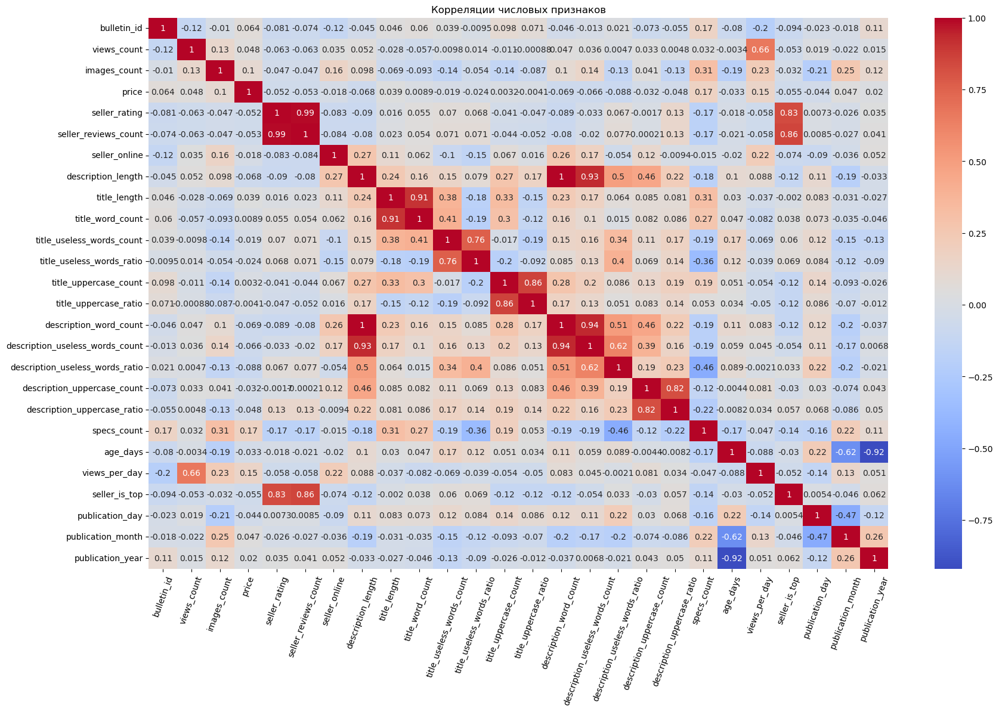

In [851]:
plt.figure(figsize=(20,12))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap="coolwarm")
plt.title("Корреляции числовых признаков")
plt.xticks(rotation=70)
plt.show()

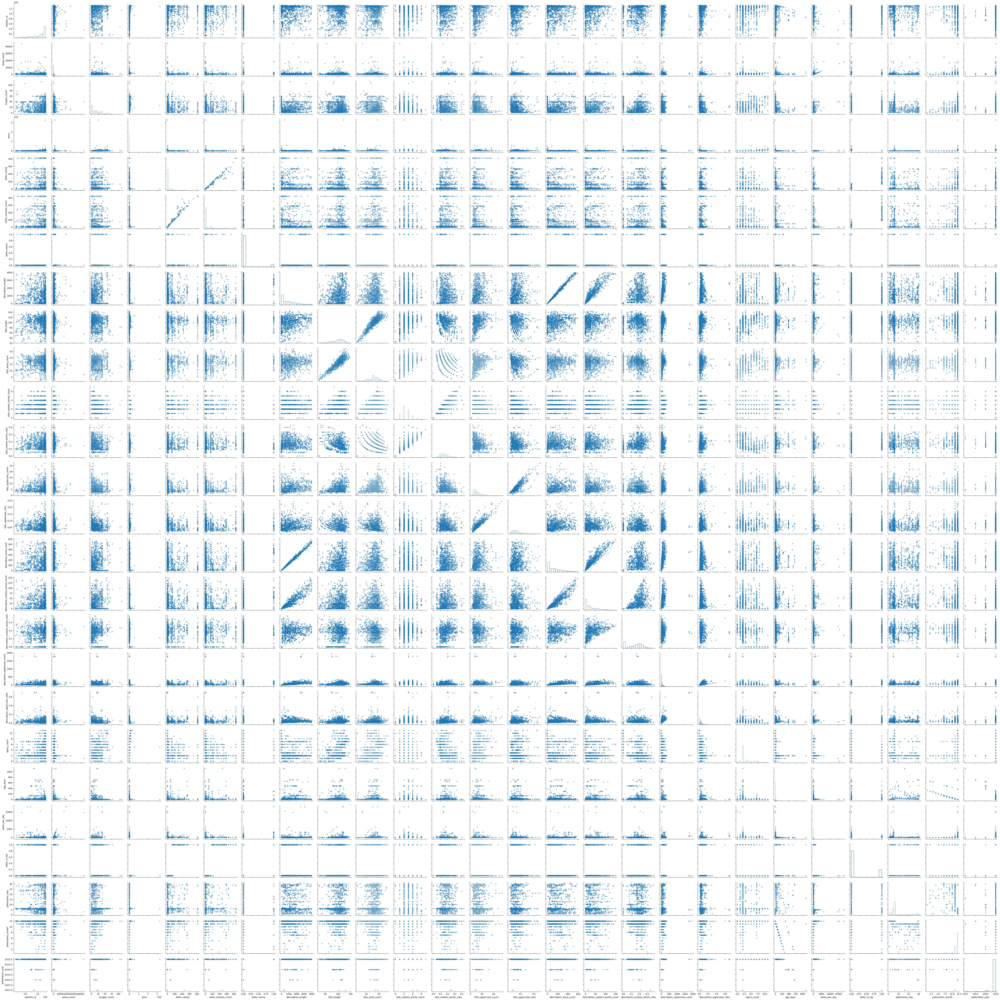

In [864]:
sns.pairplot(
    df,
    plot_kws=dict(marker="+", linewidth=1),
    diag_kws=dict(fill=False),
)

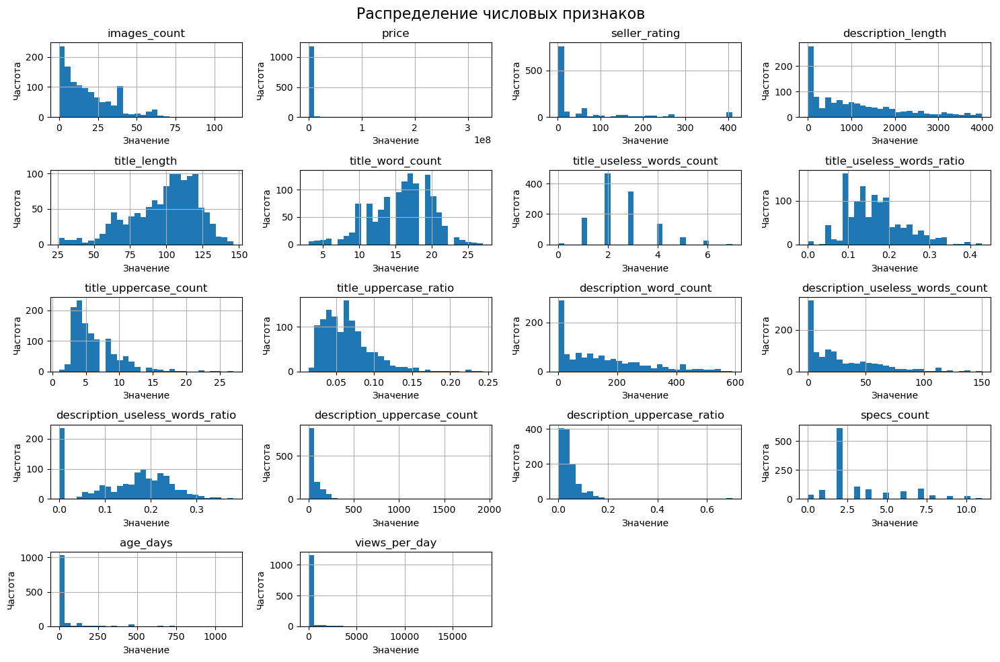

In [894]:
num_cols = df.select_dtypes(include=['int64', 'float64']).columns

fig = df[num_cols[1:]].hist(bins=30, figsize=(15, 10))

for ax in fig.flatten():
    ax.set_xlabel('Значение')
    ax.set_ylabel('Частота')
    ax.set_title(ax.get_title())

plt.suptitle('Распределение числовых признаков', fontsize=16)
plt.tight_layout()
plt.show()

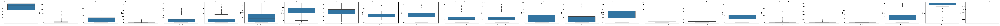

In [896]:
num_cols = df.select_dtypes(include=['float', 'int']).columns 
fig, axes = plt.subplots(1, len(num_cols), figsize=(6 * len(num_cols), 4))

for ax, col in zip(axes, num_cols):
   sns.boxplot(df[col], ax=ax)
   ax.set_title(f'Распределение {col}')
   ax.set_xlabel(col)
   ax.set_ylabel('Частота')

plt.tight_layout()
plt.show()

In [1193]:
df[df["images_count"] > 60]

,bulletin_id,source_category,views_count,images_count,price,seller_name,seller_rating,seller_reviews_count,seller_online,seller_city,...,description_useless_words_ratio,description_uppercase_count,description_uppercase_ratio,specs_count,age_days,views_per_day,seller_is_top,publication_day,publication_month,publication_year
79,47853181,rest,801,106,1.049740e+06,PlatinumFit,64.244776,74,False,Владивосток,...,0.232,147,0.046,0,0,inf,0,6,12,2025
238,99997019,rest,153,62,9.000000e+02,Летотур,17.666667,19,False,Владивосток,...,0.196,78,0.031,6,0,inf,0,6,12,2025
281,131446846,rest,801,70,1.049740e+06,GoldBeach,64.244776,74,False,Владивосток,...,0.239,24,0.015,2,0,inf,0,6,12,2025
363,16608480,rest,696,78,3.000000e+02,Mix Dance,68.000000,93,False,Владивосток,...,0.186,237,0.065,5,0,inf,1,6,12,2025
478,13803317,rest,240,66,1.600000e+03,Nataliy1866,16.333333,18,False,Владивосток,...,0.272,94,0.030,0,0,inf,0,6,12,2025
573,116466187,rest,117,66,7.000000e+00,streetsports,12.000000,12,False,Владивосток,...,0.231,29,0.024,0,0,inf,0,6,12,2025
628,128787233,rest,174,66,2.000000e+02,Nikolad,65.333333,91,False,Владивосток,...,0.305,86,0.045,4,0,inf,1,6,12,2025
961,114502525,rest,117,112,7.000000e+00,streetsports,12.000000,12,False,Владивосток,...,0.231,29,0.024,0,0,inf,0,6,12,2025
1088,130705204,rest,809,64,1.000000e+00,baza25VL,12.000000,12,False,Владивосток,...,0.214,33,0.029,1,0,inf,0,6,12,2025
1183,19692240,rest,801,68,1.049740e+06,Зоопарк Чудесный,64.244776,74,False,unknown,...,0.235,30,0.029,4,0,inf,0,6,12,2025


In [1195]:
df = df[df["images_count"] < 60]

### Data Type Conv"rsion

In [1197]:
df = df.drop(["seller_name", "bulletin_id"], axis=1)

In [1199]:
df = df.rename(columns={'category_level_1': 'sub_category', "category_level_2": "sub-sub_category"})

In [1005]:
category_features = df.select_dtypes(include=["object", "bool"])

for col in category_features:
    print(f"Уникальные значения для {col} - {df[col].unique()}, кол-во уникальных значений - {df[col].nunique()}")

Уникальные значения для source_category - ['pets' 'clothes' 'auto' 'rest' 'realty' 'tech'], кол-во уникальных значений - 6
Уникальные значения для seller_online - [False  True], кол-во уникальных значений - 2
Уникальные значения для seller_city - ['Владивосток' 'unknown'], кол-во уникальных значений - 2
Уникальные значения для sub_category - ['Животные' 'Одежда, обувь и аксессуары' 'Авто и мото'
 'Путешествия и отдых' 'Недвижимость' 'Техника' 'Бизнес' 'Услуги'
 'Дом и ремонт'], кол-во уникальных значений - 9
Уникальные значения для sub-sub_category - ['Аксессуары и корма' 'Спецодежда и средства защиты' 'Автозапчасти'
 'Китай' 'Продажа квартир' 'Климатическое и отопительное оборудование'
 'Оборудование для бизнеса' 'Городские развлечения' 'Телефоны и связь'
 'Квартиры посуточно' 'Женская одежда и обувь' 'Другое' 'Кошки'
 'Контейнеры для грузоперевозок' 'Аренда квартир' 'Автохимия и ГСМ'
 'Мужская одежда и обувь' 'Гостиницы и хостелы'
 'Активный отдых, спорт и танцы' 'Кондиционеры' 'Авто

In [1201]:
bin_cols = ["seller_online", "seller_city"]
other_cols = ["source_category", "sub_category", "sub-sub_category"]

In [1203]:
le = LabelEncoder()
for col in bin_cols:
    df[col] = le.fit_transform(df[col])

In [1205]:
encoder = OneHotEncoder(sparse_output=False)
encoded = encoder.fit_transform(df[other_cols])

X_encoded = pd.DataFrame(encoded, columns=encoder.get_feature_names_out())
X_encoded

df = df.drop(other_cols, axis=1)
df = pd.concat([df.reset_index(drop=True), X_encoded.reset_index(drop=True)], axis=1)

In [1207]:
df.to_csv("data/numeric_farpost_data-2.csv", index=False)

In [1218]:
df_scaled = df.copy()

scaler = StandardScaler()
df_scaled[df_scaled.columns] = scaler.fit_transform(df_scaled[df_scaled.columns])

# 1. User segmentation

In [1929]:
important_features_users_cols = df.columns[:23]
important_features_users_df = df[important_features_users_cols]
important_features_users_df = important_features_users_df.drop(["seller_city", "price", "seller_online"], axis=1)

important_features_users_df_scaled = important_features_users_df.copy()
important_features_users_df_scaled[important_features_users_df_scaled.columns] = scaler.fit_transform(important_features_users_df_scaled[important_features_users_df_scaled.columns])

In [2061]:
inertias = []
silhouettes = []

K = range(2, 16)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=RANDOM_STATE)
    kmeans.fit(important_features_users_df_scaled)

    inertias.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(important_features_users_df_scaled, kmeans.labels_))

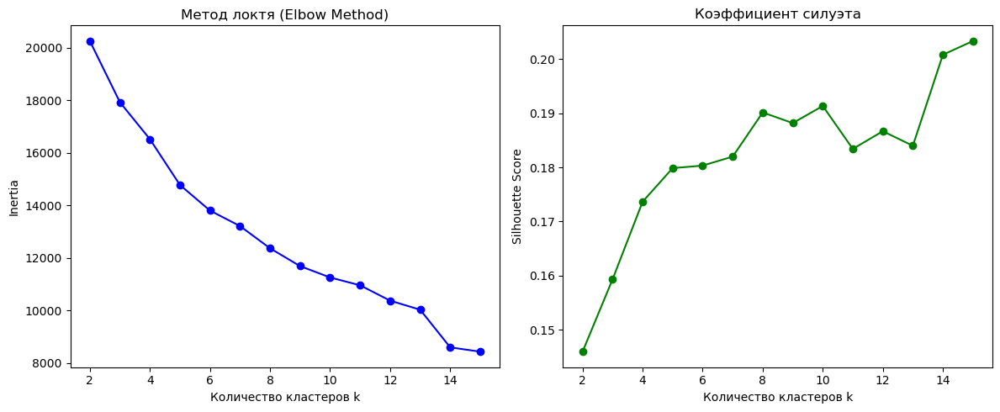

In [2062]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(K, inertias, 'bo-')
plt.xlabel('Количество кластеров k')
plt.ylabel('Inertia')
plt.title('Метод локтя (Elbow Method)')

plt.subplot(1,2,2)
plt.plot(K, silhouettes, 'go-')
plt.xlabel('Количество кластеров k')
plt.ylabel('Silhouette Score')
plt.title('Коэффициент силуэта')
plt.tight_layout()
plt.show()

In [2067]:
kmeans_best_usr = KMeans(n_clusters=8, random_state=RANDOM_STATE)
kmeans_best_usr.fit(important_features_users_df_scaled)

cluster_usr = kmeans_best_usr.labels_
important_features_users_df['cluster'] = cluster_usr

In [2071]:
inr_km_usr = kmeans_best_usr.inertia_
sil_km_usr = silhouette_score(important_features_users_df_scaled, kmeans_best_usr.labels_)
print(inr_km_usr, sil_km_usr)

12364.586830172138 0.19014623969627914


In [2111]:
tsne_usr = TSNE(n_components=2, perplexity=20)
df_emb_usr = tsne_usr.fit_transform(important_features_users_df_scaled)
data_usr = pd.DataFrame(df_emb_usr)
data_usr

,0,1
0,7.420195,46.740536
1,12.519864,-17.513784
2,16.085388,-45.745731
3,-45.915028,8.823488
4,38.123615,15.874993
...,...,...
1167,-1.384163,-22.853186
1168,25.260000,-35.656967
1169,19.001890,-38.035954
1170,28.039980,-37.766376


<Axes: xlabel='0', ylabel='1'>

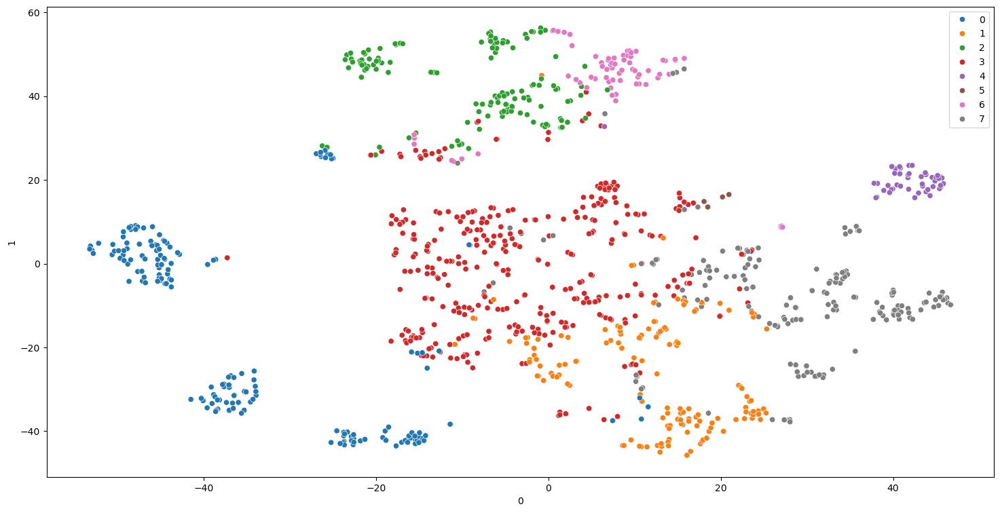

In [2112]:
plt.figure(figsize=(18,9))
sns.scatterplot(x=data_usr[0], y=data_usr[1], hue=cluster_usr, palette='tab10')

In [2119]:
df_g_usr = important_features_users_df.groupby("cluster").agg({x: ["mean", "std", "count"] for x in important_features_users_df.columns}).T
df_g_usr

cluster                       0           1           2            3  \
views_count   mean   929.689119  515.216867  542.440559   717.099448   
              std    807.923687  602.347510  919.485853  1623.292650   
              count  193.000000  166.000000  143.000000   362.000000   
images_count  mean    26.989637    8.216867   15.818182    13.292818   
              std     14.617338    9.592356   14.745559    12.054695   
...                         ...         ...         ...          ...   
seller_is_top std      0.232436    0.109431    0.000000     0.263085   
              count  193.000000  166.000000  143.000000   362.000000   
cluster       mean     0.000000    1.000000    2.000000     3.000000   
              std      0.000000    0.000000    0.000000     0.000000   
              count  193.000000  166.000000  143.000000   362.000000   

cluster                       4             5           6            7  
views_count   mean   553.468085  23423.857143  742.890411   793.342541  
              std    611.495382   9743.749542  818.164622  1705.662036  
              count   47.000000      7.000000   73.000000   181.000000  
images_count  mean     5.446809     26.285714   17.520548    24.497238  
              std      6.371842     13.585707   12.207818    14.915549  
...                         ...           ...         ...          ...  
seller_is_top std      0.204030      0.000000    0.254338     0.193352  
              count   47.000000      7.000000   73.000000   181.000000  
cluster       mean     4.000000      5.000000    6.000000     7.000000  
              std      0.000000      0.000000    0.000000     0.000000  
              count   47.000000      7.000000   73.000000   181.000000  

[63 rows x 8 columns]

In [2121]:
functions = ["mean", "std", "count"]

stat_usr = np.array([[important_features_users_df[feature].apply(f) for f in functions] for feature in important_features_users_df.columns]).flatten()

df_busy_usr = df_g_usr.copy()
df_busy_usr["Global"] = stat_usr
df_busy_usr

cluster                       0           1           2            3  \
views_count   mean   929.689119  515.216867  542.440559   717.099448   
              std    807.923687  602.347510  919.485853  1623.292650   
              count  193.000000  166.000000  143.000000   362.000000   
images_count  mean    26.989637    8.216867   15.818182    13.292818   
              std     14.617338    9.592356   14.745559    12.054695   
...                         ...         ...         ...          ...   
seller_is_top std      0.232436    0.109431    0.000000     0.263085   
              count  193.000000  166.000000  143.000000   362.000000   
cluster       mean     0.000000    1.000000    2.000000     3.000000   
              std      0.000000    0.000000    0.000000     0.000000   
              count  193.000000  166.000000  143.000000   362.000000   

cluster                       4             5           6            7  \
views_count   mean   553.468085  23423.857143  742.890411   793.342541   
              std    611.495382   9743.749542  818.164622  1705.662036   
              count   47.000000      7.000000   73.000000   181.000000   
images_count  mean     5.446809     26.285714   17.520548    24.497238   
              std      6.371842     13.585707   12.207818    14.915549   
...                         ...           ...         ...          ...   
seller_is_top std      0.204030      0.000000    0.254338     0.193352   
              count   47.000000      7.000000   73.000000   181.000000   
cluster       mean     4.000000      5.000000    6.000000     7.000000   
              std      0.000000      0.000000    0.000000     0.000000   
              count   47.000000      7.000000   73.000000   181.000000   

cluster                   Global  
views_count   mean    844.642491  
              std    2268.776680  
              count  1172.000000  
images_count  mean     16.894198  
              std      14.540760  
...                          ...  
seller_is_top std       0.415663  
              count  1172.000000  
cluster       mean      2.957338  
              std       2.295406  
              count  1172.000000  

[63 rows x 9 columns]

In [2141]:
df_busy_usr.to_csv("data/clustering_users.csv")

In [2129]:
cluster_labels_usr = [0, 1, 2, 3, 4, 5, 6, 7]

df_brel_usr = df_busy_usr.copy()

for label in cluster_labels_usr:
    df_brel_usr[label] = 100 * df_brel_usr[label] / df_brel_usr["Global"] - 100

df_brel_usr

cluster                       0           1           2           3  \
views_count   mean    10.068950  -39.001782  -35.778680  -15.100240   
              std    -64.389457  -73.450560  -59.472175  -28.450752   
              count  -83.532423  -85.836177  -87.798635  -69.112628   
images_count  mean    59.756843  -51.362784   -6.369146  -21.317261   
              std      0.526638  -34.031265    1.408442  -17.097215   
...                         ...         ...         ...         ...   
seller_is_top std    -44.080803  -73.673140 -100.000000  -36.707163   
              count  -83.532423  -85.836177  -87.798635  -69.112628   
cluster       mean  -100.000000  -66.185805  -32.371610    1.442585   
              std   -100.000000 -100.000000 -100.000000 -100.000000   
              count  -83.532423  -85.836177  -87.798635  -69.112628   

cluster                       4            5           6           7  \
views_count   mean   -34.473095  2673.227416  -12.046763   -6.073570   
              std    -73.047352   329.471513  -63.938072  -24.820188   
              count  -95.989761   -99.402730  -93.771331  -84.556314   
images_count  mean   -67.759295    55.590188    3.707486   45.003851   
              std    -56.179445    -6.568114  -16.044157    2.577503   
...                         ...          ...         ...         ...   
seller_is_top std    -50.914686  -100.000000  -38.811481  -53.483582   
              count  -95.989761   -99.402730  -93.771331  -84.556314   
cluster       mean    35.256780    69.070975  102.885170  136.699365   
              std   -100.000000  -100.000000 -100.000000 -100.000000   
              count  -95.989761   -99.402730  -93.771331  -84.556314   

cluster                   Global  
views_count   mean    844.642491  
              std    2268.776680  
              count  1172.000000  
images_count  mean     16.894198  
              std      14.540760  
...                          ...  
seller_is_top std       0.415663  
              count  1172.000000  
cluster       mean      2.957338  
              std       2.295406  
              count  1172.000000  

[63 rows x 9 columns]

<Axes: xlabel='cluster', ylabel='None-None'>

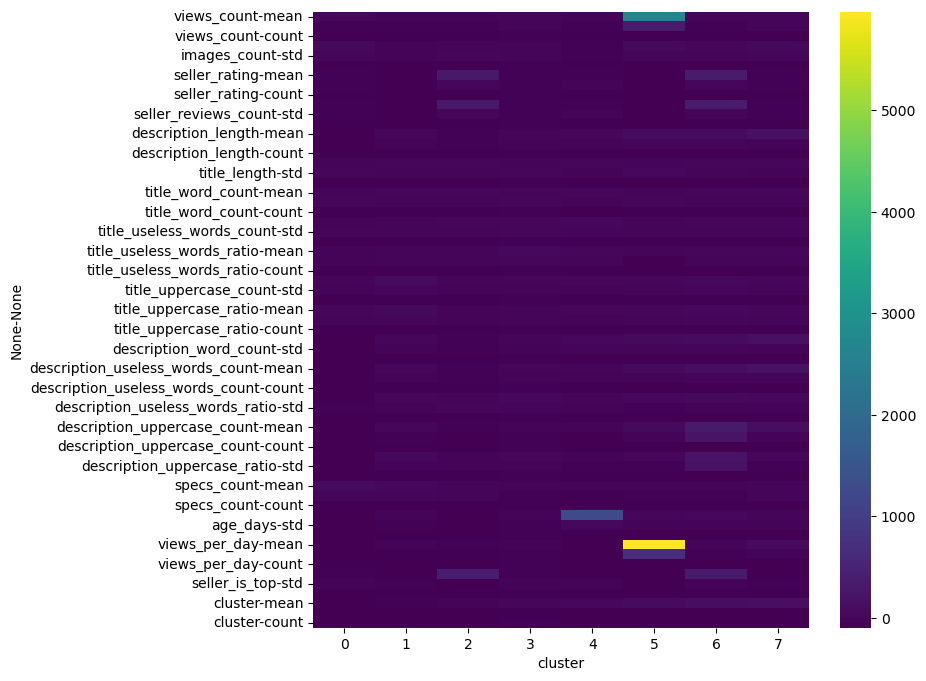

In [2139]:
plt.figure(figsize=(8, 8))
sns.heatmap(df_brel_usr[cluster_labels_usr], cmap="viridis")

## Сегменты пользователей

`Группа 0` - продавцы, которые формально выполняют требования площадки, но не вкладывают душу в свои объявления.

Характеристики:

    - 26 фото в среднем - много визуального контента
    - Почти пустые описания - 26 символов (самые короткие!)
    - 5.8 характеристик - хорошо заполнены тех. характеристики
    - Очень свежие объявления
    - Почти нет просмотров

Они только что зарегистрировались, загружают много фото под товарами, заполняют подробно характеристики, но пишут мало текста в описании. Объявления свежие, поэтому пока нет просмотров.

`Группа 1` - Активные середнячки с простыми объявлениями

Характеристики:

    - Подробные описания: 1,243 символа
    - Хороший заголовок: 113 символов, 19 слов
    - Средняя активность: 103 просмотра в день
    - среднее значение для фотографий: 8 в среднем
    - Низкий процент топовых продавцов: 1.2%

Продавцы, которые уделяют внимание текстам. Создают качественные описания, но не работают над репутацией.

`Группа 2` - супер-продавцы с фокусом на рейтинг 

Характеристики:

    - 100% топовых продавцов
    - Высокий рейтинг: 220.7
    - Много отзывов: 247.5
    - Хорошие описания: 373 символа, 51 слово
    - Оптимальная активность: 58.7 просмотров в день

Это профессиональные продавцы с безупречной репутацией. Они создают качественный контент, имеют высокий рейтинг и много отзывов.

`Группа 3` - Среднестатистические

Характеристики:

    - Самый большой кластер: 362 продавца
    - Средние показатели по всем метрикам
    - 115 просмотров в день
    - 7.5% топовых продавцов
    - 820 символов описания

Типичные продавцы площадки. Не выделяются ни в хорошую, ни в плохую сторону.

`Группа 4` - "не активные пользователи площадки"

Характеристики:

    - самые старые объявления
    - Почти нет просмотров: 0.96 в день
    - Подробные описания: 1,278 символов
    - Низкая активность

`Группа 5` - пользователи с вирусными объявлениями

Характеристики:

    - 23,423 просмотра в среднем
    - 10,434 просмотра в день
    - Длинные описания: 1,874 символа
    - Низкий рейтинг: 3.1
    - 0% топовых продавцов

У продавцов есть вирусные объявления, которые набрали огромное количество просмотров, но продавцы не имеют репутации. Возможно, это скандальные или очень привлекательные товары.

`Группа 6` - пользователи ниже на ступень профессионалов

Характеристики:

    - 93% топовых продавцов 
    - Самые подробные описания: 1,888 символов
    - Высокий рейтинг: 246.7
    - Много отзывов: 284.8
    - Хорошая популярность: 124 просмотра в день

Очень близки к кластеру 2 по качеству. Создают самые подробные описания, имеют отличную репутацию. Много капса в описании

`Группа 7` - Активные с хорошим контентом

Характеристики:

    - Максимальные описания: 2,787 символов
    - Хорошая активность: 287 просмотров в день
    - Низкий процент топовых: 3.9%
    - Хорошие заголовки: 109 символов

Продавцы, которые создают очень подробный контент, репутация у них слабая. Получают хорошую активность за счет качества контента.

## Некоторые рекомендации 

Группы `2` и `6` — Частные перекупщики, мелкие комиссионки или активные продавцы вещей. Это продавцы, приносящие площадке основную долю сделок. Им нужны особые условия, приоритетная поддержка и инструменты для удержания. Их потеря критична.

Сегменты `0` — «Перспективные профессионалы». Их стоит обучать и поощрять. Можно предложить им бесплатный буст объявлений.

Сегмент `3` — «Масса». Это основа трафика. Для них важна простота размещения, стабильность работы площадки и базовые инструменты продвижения.

# 2. Visualization categories time periods 

In [1320]:
categories = df.columns[26:32]

sub_categories = df.columns[32:]

df_periods = df.copy()

season_map = {
    12: 'Зима', 1: 'Зима', 2: 'Зима', 
    3: 'Весна', 4: 'Весна', 5: 'Весна',
    6: 'Лето', 7: 'Лето', 8: 'Лето', 
    9: 'Осень', 10: 'Осень', 11: 'Осень'
}

df_periods['publication_season'] = df_periods['publication_month'].map(season_map)

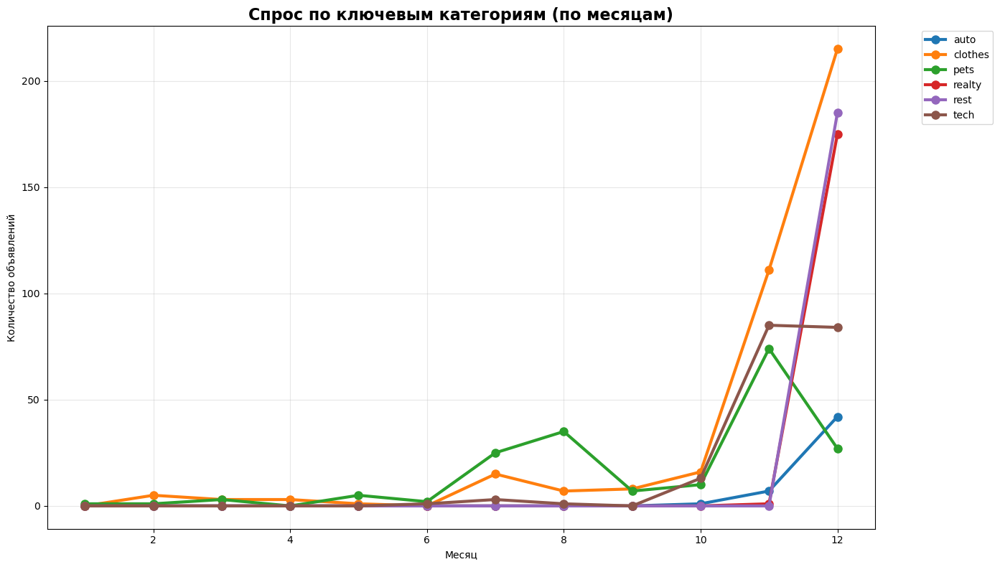

In [1394]:
plt.figure(figsize=(14, 8))

monthly_demand = df_periods.groupby('publication_month')[categories].sum()

for cat in categories:
    plt.plot(monthly_demand.index, monthly_demand[cat], 
             marker='o', linewidth=3, markersize=8, 
             label=cat.replace('source_category_', ''))

plt.title('Спрос по ключевым категориям (по месяцам)', fontsize=16, fontweight='bold')
plt.xlabel('Месяц')
plt.ylabel('Количество объявлений')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

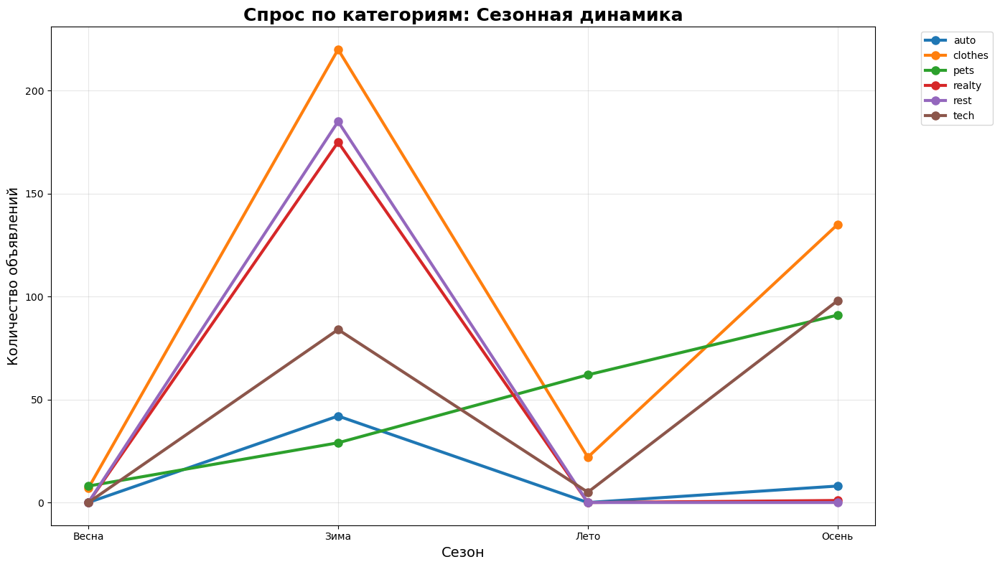

In [1405]:
plt.figure(figsize=(14, 8))

season_demand = df_periods.groupby('publication_season')[categories].sum()

for cat in categories:
    plt.plot(season_demand.index, season_demand[cat], 
             marker='o', linewidth=3, markersize=8,
             label=cat.replace('source_category_', ''))

plt.title('Спрос по категориям: Сезонная динамика', fontsize=18, fontweight='bold')
plt.xlabel('Сезон', fontsize=14)
plt.ylabel('Количество объявлений', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.tight_layout()
plt.show()


In [1388]:
mapping = []

for sub in sub_categories:
    # оставляем строки где подкатегория = 1
    filtered = df[df[sub] == 1]

    # считаем по каждой source_category, сколько раз встречается вместе
    counts = filtered[categories].sum()

    # выбираем только где count > 0
    linked = counts[counts > 0]

    if not linked.empty:
        for cat, cnt in linked.items():
            mapping.append([sub, cat, int(cnt)])
    else:
        mapping.append([sub, None, 0])

mapping_df = pd.DataFrame(mapping, columns=["sub_category", "source_category", "count_rows"])
mapping_df

hierarchy_data = []

for source_cat in color_map.keys():
    source_name = source_cat.replace('source_category_', '')
    subs = mapping_df[mapping_df['source_category'] == source_cat]
    
    # Главная категория
    hierarchy_data.append({
        'path': [source_name],
        'value': subs['count_rows'].sum(),
        'label': source_name,
        'color_group': source_name
    })
    
    # Подкатегории (те же цвета что и у родителя)
    for _, row in subs.iterrows():
        sub_name = row['sub_category'].replace('sub_category_', '').replace('sub-sub_category_', '')[:30]
        hierarchy_data.append({
            'path': [source_name, sub_name],
            'value': row['count_rows'],
            'label': f"{source_name} → {sub_name}",
            'color_group': source_name
        })

hierarchy_df = pd.DataFrame(hierarchy_data)

plotly_colors = {
    'auto': color_map['source_category_auto'],
    'clothes': color_map['source_category_clothes'],
    'pets': color_map['source_category_pets'],
    'realty': color_map['source_category_realty'],
    'rest': color_map['source_category_rest'],
    'tech': color_map['source_category_tech']
}

hierarchy_df['color_key'] = hierarchy_df['color_group'].str.lower()

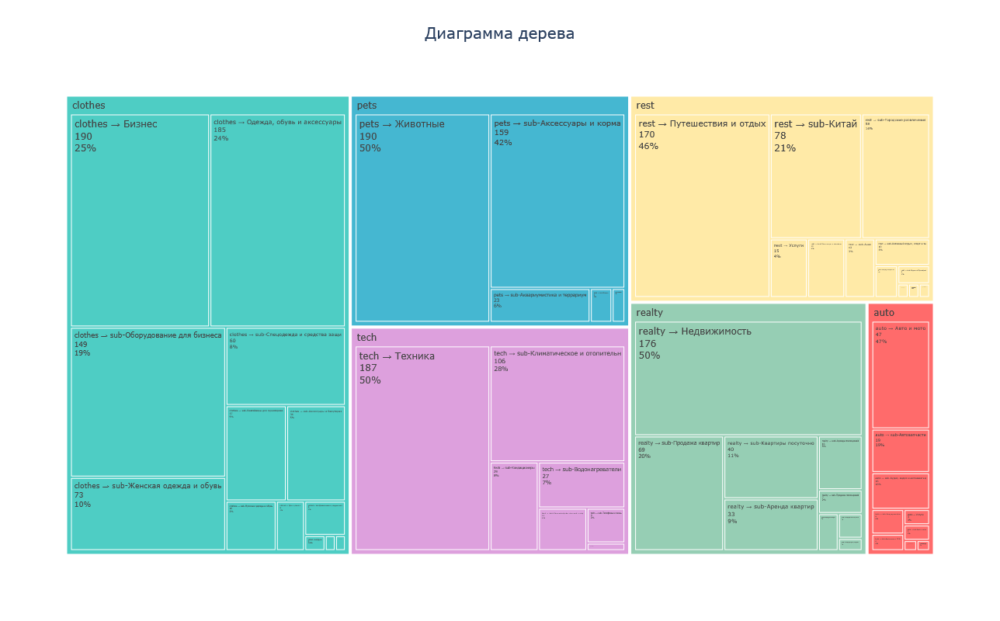

In [1390]:
colors_list = [plotly_colors.get(row['color_key'], '#CCCCCC') for _, row in hierarchy_df.iterrows()]

fig = go.Figure(go.Treemap(
    labels=hierarchy_df['label'],
    parents=["" if len(path) == 1 else path[0] for path in hierarchy_df['path']],
    values=hierarchy_df['value'],
    branchvalues="total",
    
    marker=dict(
        colors=colors_list,
        showscale=False  # Убираем цветовую шкалу
    ),
    
    textinfo="label+value+percent parent",
    hovertemplate='<b>%{label}</b><br>Объявлений: %{value:,}<br>Доля: %{percentParent:.1%}<extra></extra>'
))

fig.update_layout(
    title={
        'text': 'Диаграмма дерева',
        'x': 0.5,
        'font': {'size': 20}
    },
    width=1200,
    height=800
)
fig.show()


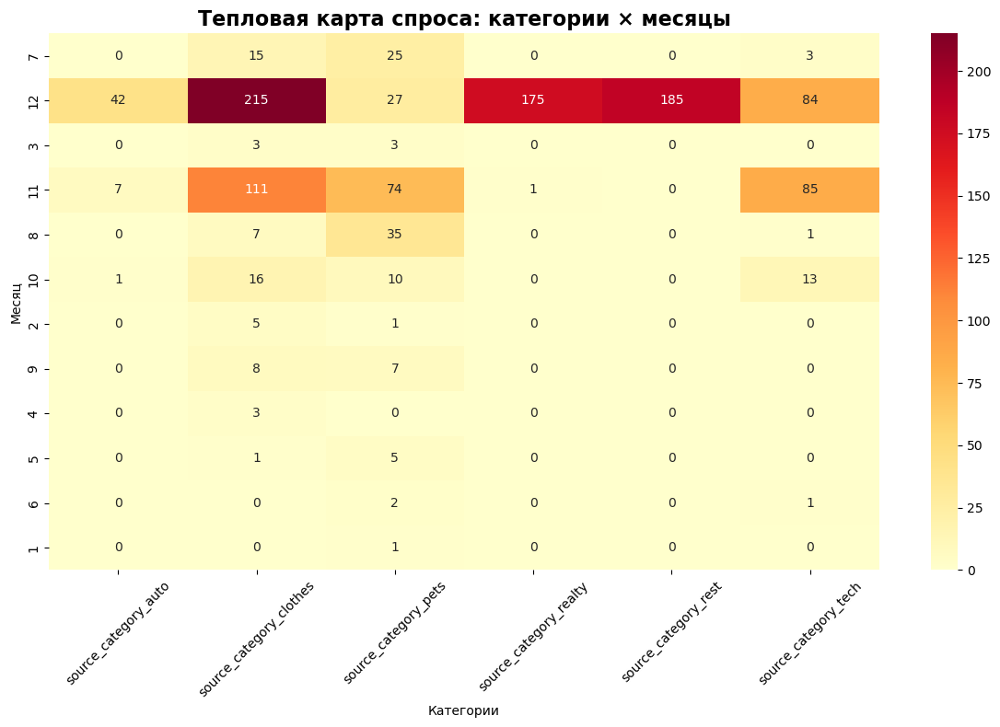

In [1423]:
heatmap_data = []
for month in df_periods['publication_month'].unique():
    row = {'month': month}
    month_data = df_periods[df_periods['publication_month'] == month]
    for cat in categories:
        row[cat] = month_data[cat].sum()
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(heatmap_data)
heatmap_pivot = heatmap_df.set_index('month')[categories]

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_pivot, annot=True, fmt='.0f', cmap='YlOrRd')
plt.title('Тепловая карта спроса: категории × месяцы', fontsize=16, fontweight='bold')
plt.xlabel('Категории')
plt.ylabel('Месяц')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

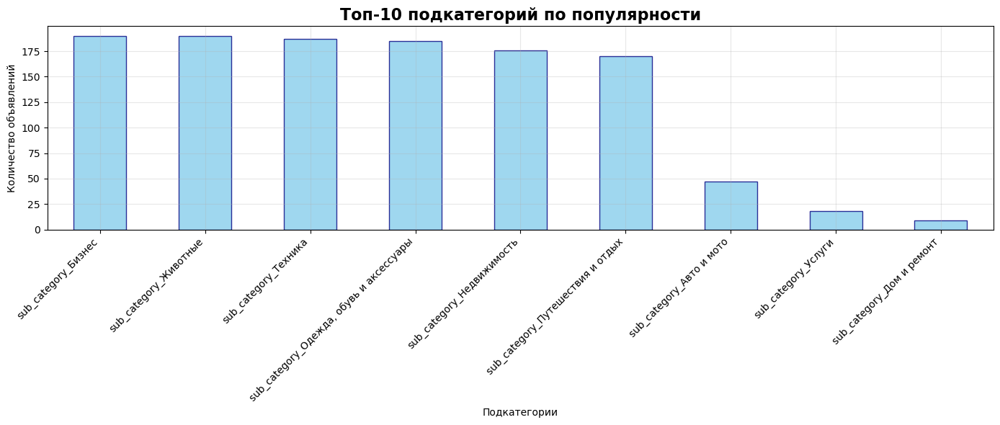

In [1411]:
# Топ-10 подкатегорий по объявлениям
sub_cats = [col for col in df.columns if col.startswith('sub_category_')]
subcat_popularity = df[sub_cats].sum(axis=0).sort_values(ascending=False).head(10)

plt.figure(figsize=(14, 6))
subcat_popularity.plot(kind='bar', color='skyblue', edgecolor='navy', alpha=0.8)
plt.title('Топ-10 подкатегорий по популярности', fontsize=16, fontweight='bold')
plt.xlabel('Подкатегории')
plt.ylabel('Количество объявлений')
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


<Figure size 1200x600 with 0 Axes>

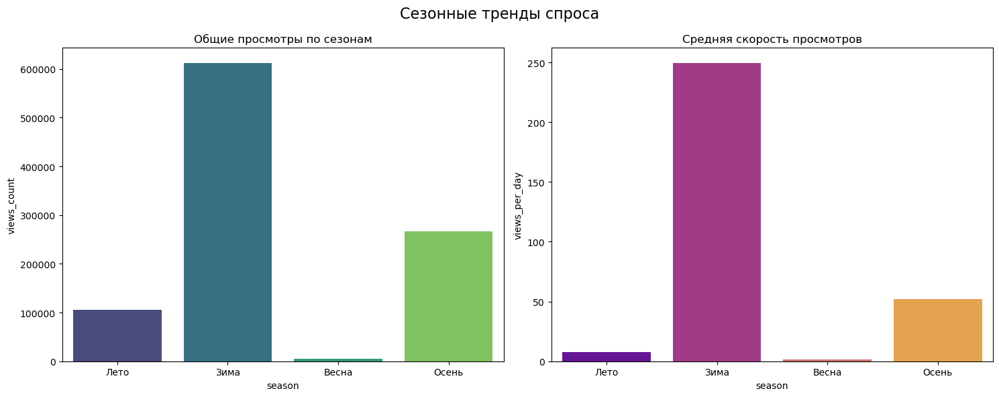

In [1294]:
plt.figure(figsize=(12, 6))

# Сезонные статистики
season_stats = []
for season in df_periods['publication_season'].unique():
    season_data = df_periods[df_periods['publication_season'] == season]
    stats = {'season': season}
    stats['views_count'] = season_data['views_count'].sum()
    stats['views_per_day'] = season_data['views_per_day'].mean()
    season_stats.append(stats)

season_df = pd.DataFrame(season_stats)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

sns.barplot(data=season_df, x='season', y='views_count', ax=ax1, palette='viridis')
ax1.set_title('Общие просмотры по сезонам')

sns.barplot(data=season_df, x='season', y='views_per_day', ax=ax2, palette='plasma')
ax2.set_title('Средняя скорость просмотров')

plt.suptitle('Сезонные тренды спроса', fontsize=16)
plt.tight_layout()
plt.show()


# 3. Predicting the popularity of ads

In [1063]:
inertias = []
silhouettes = []

K = range(2, 50)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=1)
    kmeans.fit(df)

    inertias.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(df, kmeans.labels_))

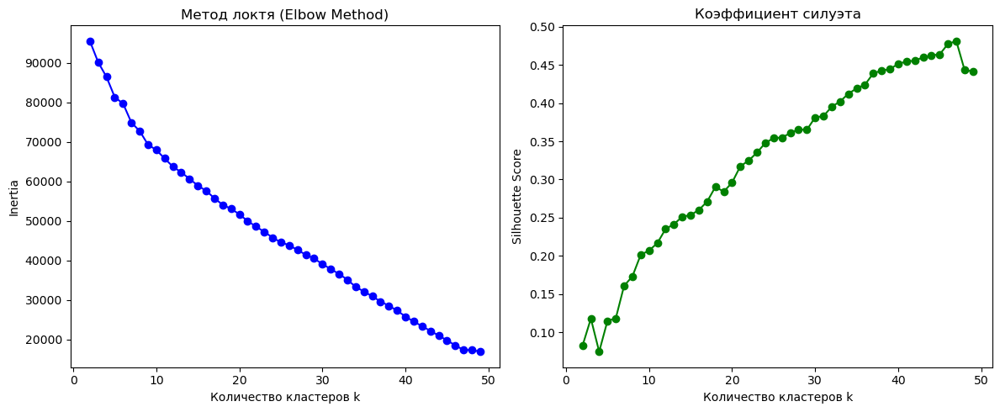

In [1065]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(K, inertias, 'bo-')
plt.xlabel('Количество кластеров k')
plt.ylabel('Inertia')
plt.title('Метод локтя (Elbow Method)')

plt.subplot(1,2,2)
plt.plot(K, silhouettes, 'go-')
plt.xlabel('Количество кластеров k')
plt.ylabel('Silhouette Score')
plt.title('Коэффициент силуэта')
plt.tight_layout()
plt.show()

In [1222]:
kmeans_best = KMeans(n_clusters=10, random_state=RANDOM_STATE)
kmeans_best.fit(df_scaled)

df_processing_km = df.copy()

cluster = kmeans_best.labels_
df_processing_km['cluster'] = cluster

In [2059]:
inr_km = kmeans_best.inertia_
sil_km = silhouette_score(df_scaled, kmeans_best.labels_)
print(inr_km, sil_km)

68646.88868282152 0.20248526963241367


In [1166]:
tsne = TSNE(n_components=2, perplexity=50)
df_emb = tsne.fit_transform(df)
data = pd.DataFrame(df_emb)
data

,0,1
0,22.701010,-5.185748
1,12.936882,-25.812042
2,8.574383,4.079455
3,-30.048313,-5.961063
4,29.353649,-5.320919
...,...,...
1167,-0.397889,2.244900
1168,17.018723,17.315331
1169,15.462601,30.045177
1170,17.038036,17.301569


<Axes: xlabel='0', ylabel='1'>

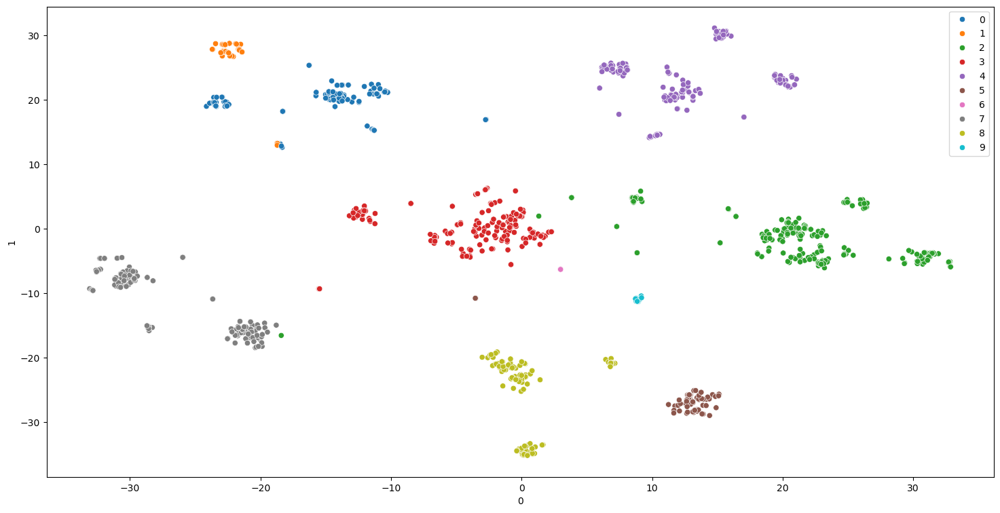

In [1429]:
plt.figure(figsize=(18,9))
sns.scatterplot(x=data[0], y=data[1], hue=cluster, palette='tab10')

In [1226]:
important_features_col = df.columns[:32]
important_features = df[important_features_col]

df_g = df_processing_km.groupby("cluster").agg({x: ["mean", "std", "count"] for x in important_features}).T
df_g

cluster                               0           1            2            3  \
views_count          mean   1346.069231  437.543478   871.973333   951.175000   
                     std    1137.076451  520.882444  3185.571090  3150.003767   
                     count   130.000000   46.000000   225.000000   200.000000   
images_count         mean     34.876923   31.000000    12.373333    11.830000   
                     std      14.174995   12.348639     9.997464    11.396954   
...                                 ...         ...          ...          ...   
source_category_rest std       0.000000    0.000000     0.066667     0.218492   
                     count   130.000000   46.000000   225.000000   200.000000   
source_category_tech mean      0.000000    0.000000     0.000000     0.000000   
                     std       0.000000    0.000000     0.000000     0.000000   
                     count   130.000000   46.000000   225.000000   200.000000   

cluster                               4           5            6           7  \
views_count          mean   1071.459893  342.323077  4675.444444  543.727811   
                     std    2323.735559  665.681162  5469.721476  517.981508   
                     count   187.000000   65.000000     9.000000  169.000000   
images_count         mean     14.005348   10.984615    26.444444   24.828402   
                     std      13.394148   11.957597    14.379770   11.906387   
...                                 ...         ...          ...         ...   
source_category_rest std       0.000000    0.268543     0.000000    0.000000   
                     count   187.000000   65.000000     9.000000  169.000000   
source_category_tech mean      1.000000    0.000000     0.000000    0.000000   
                     std       0.000000    0.000000     0.000000    0.000000   
                     count   187.000000   65.000000     9.000000  169.000000   

cluster                              8           9  
views_count          mean   378.912000  276.812500  
                     std    509.885044  451.165486  
                     count  125.000000   16.000000  
images_count         mean     7.160000    1.750000  
                     std      7.420982    1.341641  
...                                ...         ...  
source_category_rest std      0.000000    0.000000  
                     count  125.000000   16.000000  
source_category_tech mean     0.000000    0.000000  
                     std      0.000000    0.000000  
                     count  125.000000   16.000000  

[96 rows x 10 columns]

In [1228]:
functions = ["mean", "std", "count"]

stat = np.array([[df[feature].apply(f) for f in functions] for feature in important_features]).flatten()

df_busy = df_g.copy()
df_busy["Global"] = stat
df_busy

cluster                               0           1            2            3  \
views_count          mean   1346.069231  437.543478   871.973333   951.175000   
                     std    1137.076451  520.882444  3185.571090  3150.003767   
                     count   130.000000   46.000000   225.000000   200.000000   
images_count         mean     34.876923   31.000000    12.373333    11.830000   
                     std      14.174995   12.348639     9.997464    11.396954   
...                                 ...         ...          ...          ...   
source_category_rest std       0.000000    0.000000     0.066667     0.218492   
                     count   130.000000   46.000000   225.000000   200.000000   
source_category_tech mean      0.000000    0.000000     0.000000     0.000000   
                     std       0.000000    0.000000     0.000000     0.000000   
                     count   130.000000   46.000000   225.000000   200.000000   

cluster                               4           5            6           7  \
views_count          mean   1071.459893  342.323077  4675.444444  543.727811   
                     std    2323.735559  665.681162  5469.721476  517.981508   
                     count   187.000000   65.000000     9.000000  169.000000   
images_count         mean     14.005348   10.984615    26.444444   24.828402   
                     std      13.394148   11.957597    14.379770   11.906387   
...                                 ...         ...          ...         ...   
source_category_rest std       0.000000    0.268543     0.000000    0.000000   
                     count   187.000000   65.000000     9.000000  169.000000   
source_category_tech mean      1.000000    0.000000     0.000000    0.000000   
                     std       0.000000    0.000000     0.000000    0.000000   
                     count   187.000000   65.000000     9.000000  169.000000   

cluster                              8           9       Global  
views_count          mean   378.912000  276.812500   844.642491  
                     std    509.885044  451.165486  2268.776680  
                     count  125.000000   16.000000  1172.000000  
images_count         mean     7.160000    1.750000    16.894198  
                     std      7.420982    1.341641    14.540760  
...                                ...         ...          ...  
source_category_rest std      0.000000    0.000000     0.364756  
                     count  125.000000   16.000000  1172.000000  
source_category_tech mean     0.000000    0.000000     0.159556  
                     std      0.000000    0.000000     0.366350  
                     count  125.000000   16.000000  1172.000000  

[96 rows x 11 columns]

## На основе этих данных можем Провести анализ:

### Кластер 0: Это самый крупный кластер с огромными ценами (8+ млн руб в среднем) и длинными описаниями (606 символов). Объявления свежие (age_days=0), мало просмотров (1346), но много фото (35). 100% недвижимость (source_category_realty=1). Продавцы не топовые.

### Кластер 1: Топовые продавцы с низкими ценами. Маленький кластер супер-продавцов (seller_rating=170, seller_is_top=85%). Минимальные цены (2536 руб), мало просмотров (437) и свежие (age_days<1). Все недвижимость. Короткие описания (170 символов).

### Кластер 3: Одежда (95%) с высокими ценами (235к руб) и очень длинными описаниями (1447 символов). Много заглавных букв (143 в описании). Средний возраст (42 дня).

### Кластер 4: 100% техника (source_category_tech=1) с высокими просмотрами в день (512/день) и свежими объявлениями (13 дней). Длинные описания (2062 символа), много specs (3.8). Средние цены (162к).

### Кластер 5: Одежда (92%) + немного животных. Средние показатели по всем метрикам. Средний возраст (20 дней).

### Кластер 6: элитный кластер с огромными просмотрами (4675) и высокой скоростью (1123/день). Премиум цены (234к), свежие (29 дней). Много фото (26).

### Кластер 7: Массовый рынок. Средние цены (162к), свежие (age_days=0), средние продавцы. Разнородный кластер без ярких отличий.

### Кластер 8: Бюджетные товары. Низкие цены (5.5к руб), мало фото (7), свежие (9 дней). Хорошие продавцы (seller_is_top=44%).

### Кластер 9: Авто объявления. 100% автомобили с минимальными ценами (2к руб), без отзывов, свежие. Мало specs и фото (1.75).

---

### Для предсказания популярности объявления можем выделить кластер 6 в котором: высокие показатели views_count — около 4675, скорость просмотров максимальная. В кластере 6 находятся самые популярные объявления
### Также выделим 4 кластер, в котором плюс минус схожая ситуация, но чуть похуже. Высокие показатели по просмотрам и скорости просмотра

### Если классификатор классифицирует объект в 4 или 6 кластер считаем, что объявление будет популярным

---

### Справка по 6 кластеру

большое количество просмотров, в среднем 26 фотографий добавляют, рейтинг 26 по глобалу 55, отзывов 30 по глобалу 63, длинна описания 1303 символа (163 слова, стоп слова - 9), длинна названия 82 (кол-во слов 12, мин. кол-во стоп слов - 2, мин. аппер кейс - 2), доп харки - 2.

Их успех в лаконичном тексте, в силе текста. Краткость сестра таланта или скандальные товары.

In [2156]:
cluster_labels = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

df_brel = df_busy.copy()

for label in cluster_labels:
    df_brel[label] = 100 * df_brel[label] / df_brel["Global"] - 100

df_brel

cluster                              0           1           2           3  \
views_count          mean    59.365559  -48.197790    3.235788   12.612734   
                     std    -49.881517  -77.041264   40.409196   38.841509   
                     count  -88.907850  -96.075085  -80.802048  -82.935154   
images_count         mean   106.443201   83.494949  -26.759865  -29.975960   
                     std     -2.515452  -15.075699  -31.245247  -21.620649   
...                                ...         ...         ...         ...   
source_category_rest std   -100.000000 -100.000000  -81.722931  -40.099137   
                     count  -88.907850  -96.075085  -80.802048  -82.935154   
source_category_tech mean  -100.000000 -100.000000 -100.000000 -100.000000   
                     std   -100.000000 -100.000000 -100.000000 -100.000000   
                     count  -88.907850  -96.075085  -80.802048  -82.935154   

cluster                              4           5           6           7  \
views_count          mean    26.853657  -59.471246  453.541231  -35.626278   
                     std      2.422401  -70.659027  141.086817  -77.169128   
                     count  -84.044369  -94.453925  -99.232082  -85.580205   
images_count         mean   -17.099660  -34.979953   56.529742   46.964079   
                     std     -7.885506  -17.764979   -1.107169  -18.117166   
...                                ...         ...         ...         ...   
source_category_rest std   -100.000000  -26.377294 -100.000000 -100.000000   
                     count  -84.044369  -94.453925  -99.232082  -85.580205   
source_category_tech mean   526.737968 -100.000000 -100.000000 -100.000000   
                     std   -100.000000 -100.000000 -100.000000 -100.000000   
                     count  -84.044369  -94.453925  -99.232082  -85.580205   

cluster                              8           9       Global  
views_count          mean   -55.139363  -67.227259   844.642491  
                     std    -77.525992  -80.114152  2268.776680  
                     count  -89.334471  -98.634812  1172.000000  
images_count         mean   -57.618586  -89.641414    16.894198  
                     std    -48.964281  -90.773242    14.540760  
...                                ...         ...          ...  
source_category_rest std   -100.000000 -100.000000     0.364756  
                     count  -89.334471  -98.634812  1172.000000  
source_category_tech mean  -100.000000 -100.000000     0.159556  
                     std   -100.000000 -100.000000     0.366350  
                     count  -89.334471  -98.634812  1172.000000  

[96 rows x 11 columns]

<Axes: xlabel='cluster', ylabel='None-None'>

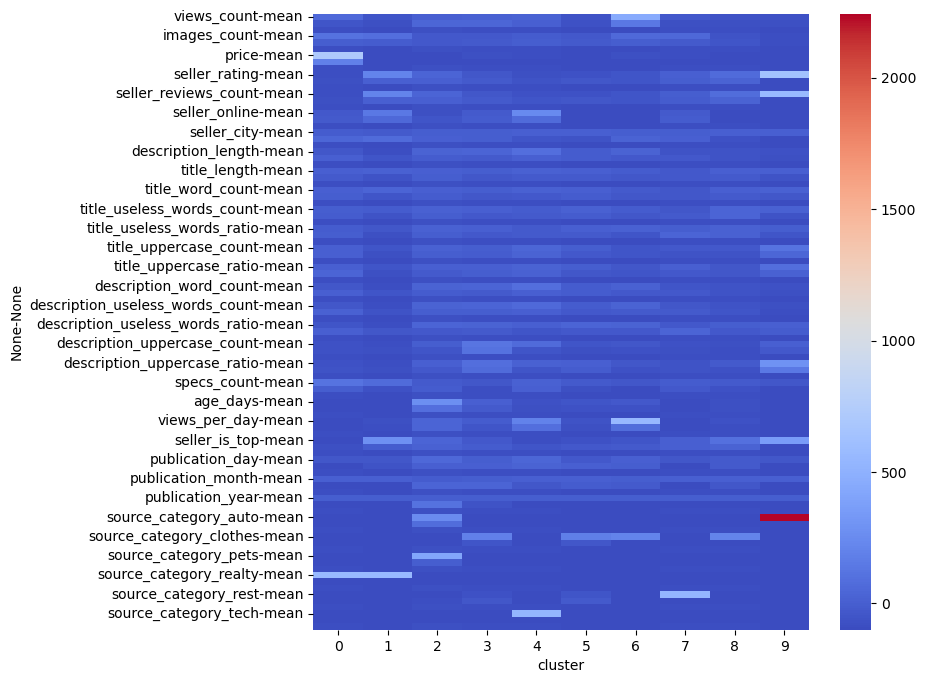

In [1232]:
plt.figure(figsize=(8, 8))
sns.heatmap(df_brel[cluster_labels], cmap="coolwarm")

In [1239]:
df_busy.to_csv("data/analysys_cluster-3.csv")

In [1441]:
X = df_processing_km.drop(["cluster"], axis=1)
y = df_processing_km["cluster"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=RANDOM_STATE, stratify=y)

In [1443]:
dtc = DecisionTreeClassifier(random_state=RANDOM_STATE)

In [1445]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 7, 10, 15, 20],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 8],
    'max_features': ['sqrt', 'log2'],
}

In [1447]:
grid_search = GridSearchCV(
    estimator=dtc,
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=1
)

In [1451]:
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 384 candidates, totalling 1920 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7, 10, 15, 20],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4, 8],
                         'min_samples_split': [2, 5, 10, 20]},
             scoring='accuracy', verbose=1)

In [1453]:
grid_search.best_params_

{'criterion': 'gini',
 'max_depth': 15,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [1461]:
best_dtc = grid_search.best_estimator_
y_pred = best_dtc.predict(X_test)

In [1463]:
acc = accuracy_score(y_test, y_pred)

0.9689922480620154

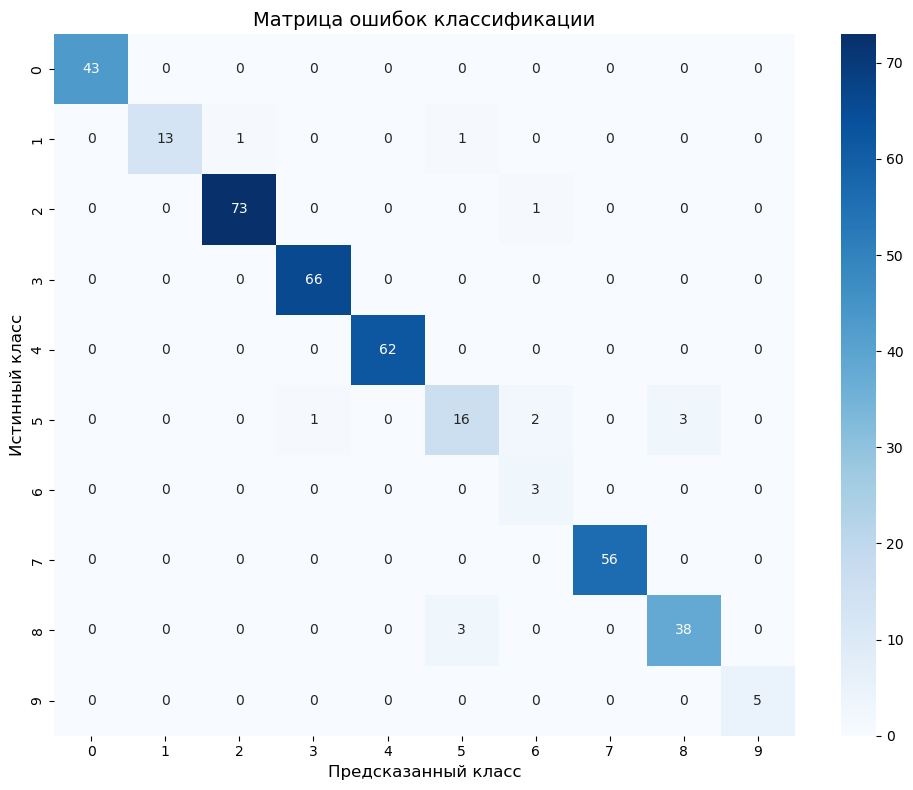

In [1471]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

plt.title('Матрица ошибок классификации', fontsize=14)
plt.xlabel('Предсказанный класс', fontsize=12)
plt.ylabel('Истинный класс', fontsize=12)
plt.tight_layout()
plt.show()

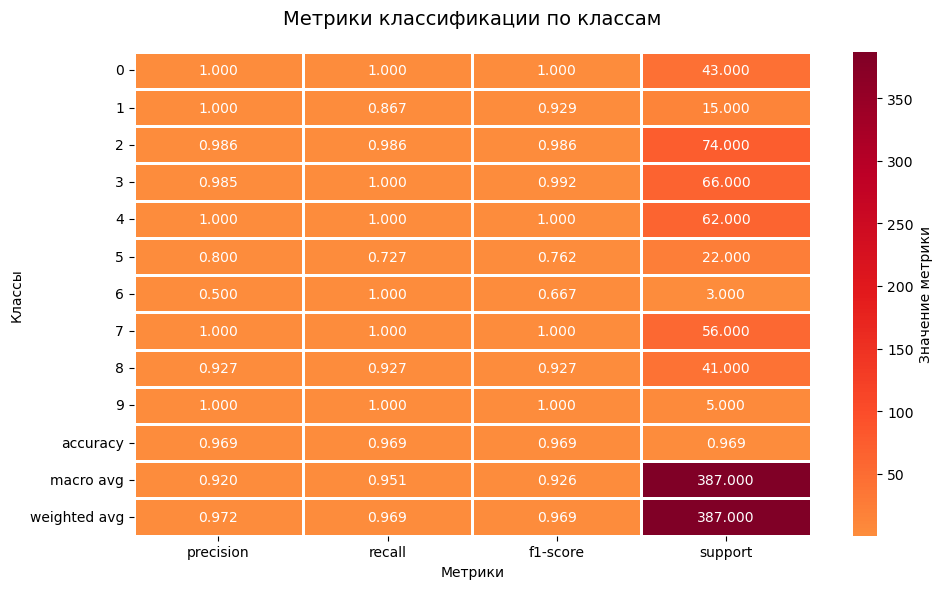

In [1487]:
report_dict = classification_report(y_test, y_pred, output_dict=True)
metrics_df = pd.DataFrame(report_dict).transpose()

plt.figure(figsize=(10, 6))
sns.heatmap(metrics_df, 
            annot=True, 
            fmt='.3f', 
            cmap='YlOrRd',
            center=0.5,
            linewidths=1,
            cbar_kws={'label': 'Значение метрики'})

plt.title('Метрики классификации по классам', fontsize=14, pad=20)
plt.xlabel('Метрики')
plt.ylabel('Классы')
plt.tight_layout()
plt.show()

# 4. Evaluation of the effectiveness

age_days - Возраст объявления на момент парсинга

views_per_day - Скорость просмотров (views_count / age_days)

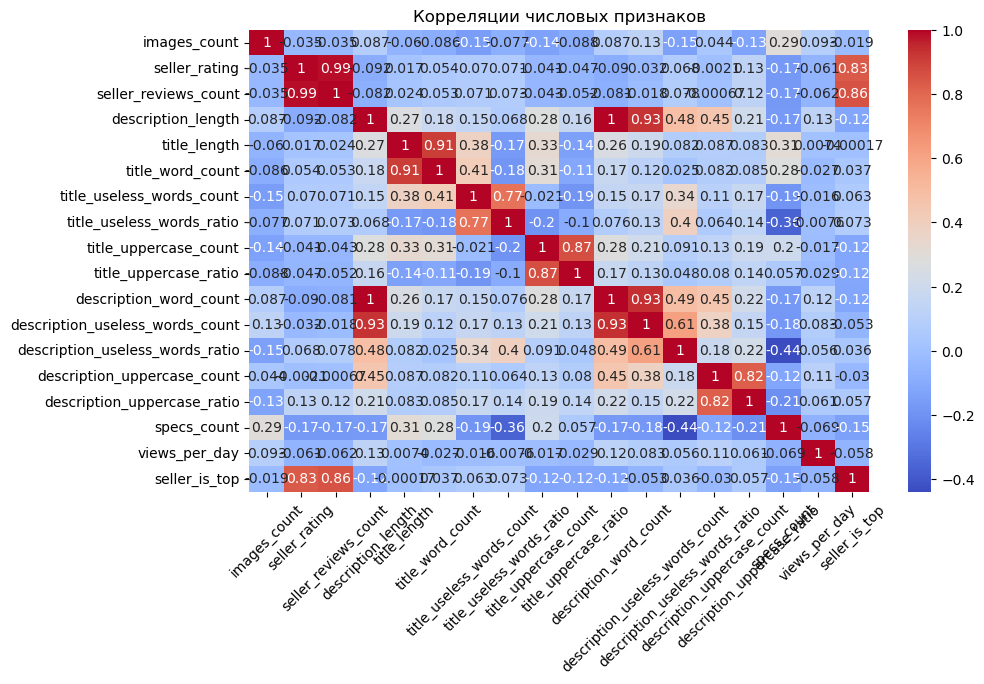

In [2531]:
plt.figure(figsize=(10,6))
sns.heatmap(important_features_df.corr(numeric_only=True), annot=True, cmap="coolwarm")
plt.title("Корреляции числовых признаков")
plt.xticks(rotation=45)
plt.show()

In [2651]:
important_features_df = important_features_users_df.drop(["views_count", "age_days", "cluster", "description_word_count", "seller_rating", "seller_is_top"], axis=1)
important_features_df2 = important_features_df[important_features_df["views_per_day"] != 0]

X_eff = important_features_df2.drop(["views_per_day"], axis=1)
y_eff = important_features_df2["views_per_day"]

X_eff[X_eff.columns] = scaler.fit_transform(X_eff[X_eff.columns])

In [2653]:
X_train_eff, X_test_eff, y_train_eff, y_test_eff = train_test_split(X_eff, y_eff, test_size=0.33, random_state=RANDOM_STATE)

In [2989]:
xgb = XGBRegressor(
    n_estimators=500,
    learning_rate=0.38,
    max_depth=10,
    subsample=0.85,
    colsample_bytree=0.8,
    reg_alpha=0.2,
    reg_lambda=2.0,
    random_state=42,
    n_jobs=-1
)

xgb.fit(X_train_eff, y_train_eff)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.38, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=10,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=500,
             n_jobs=-1, num_parallel_tree=None, ...)

In [3054]:
print(f"R²: {r2_score(y_test_eff, xgb.predict(X_test_eff)):.3f}")
print(f"mae: {mean_absolute_error(y_test_eff, xgb.predict(X_test_eff)):.3f}")
print(f"mse: {mean_squared_error(y_test_eff, xgb.predict(X_test_eff)):.3f}")

R²: 0.429
mae: 0.268
mse: 0.116


In [3056]:
importance_xgb_df = pd.DataFrame({
    'feature': X_train_eff.columns,
    'importance': xgb.feature_importances_
}).sort_values('importance', ascending=False)

In [3170]:
importance_xgb_df

,feature,importance
3,title_length,0.303340
0,images_count,0.185788
4,title_word_count,0.116575
2,description_length,0.080998
11,description_uppercase_count,0.058422
1,seller_reviews_count,0.052447
10,description_useless_words_ratio,0.040993
12,description_uppercase_ratio,0.038635
6,title_useless_words_ratio,0.035630
7,title_uppercase_count,0.033655


In [3204]:
sample_req = {
    'images_count': 1,
    'seller_reviews_count': 5,
    'description_length': 50,
    'title_length': 12,
    'title_word_count': 18,
    'title_useless_words_count': 1,
    'title_useless_words_ratio': 0.056,
    'title_uppercase_count': 3,
    'title_uppercase_ratio': 0.031,
    'description_useless_words_count': 0,
    'description_useless_words_ratio': 0.0,
    'description_uppercase_count': 0,
    'description_uppercase_ratio': 0.0,
    'specs_count': 2,
}

ad_df = pd.DataFrame([sample_req])

predicted = xgb.predict(ad_df)[0]

y_pred_train = xgb.predict(X_train_eff)
p25 = np.percentile(y_pred_train, 25)
p50 = np.percentile(y_pred_train, 50)
p75 = np.percentile(y_pred_train, 75)
p90 = np.percentile(y_pred_train, 90)

def effectly(num):
    if predicted >= p90:
        effectiveness = "лучшая!"
        overall_verdict = "Объявление имеет выдающийся потенциал!"
        recommendations = ""
    elif predicted >= p75:
        effectiveness = "очень высокая"
        overall_verdict = "Отличное объявление, высокий потенциал просмотров"
        recommendations = ""
    elif predicted >= p50:
        effectiveness = "высокая"
        overall_verdict = "Хорошее объявление, можно немного улучшить"
        recommendations = "Обратите внимание на длинну названия, количество изображений, количество слов в названии, длинну описания, заглавные буквы в описании"
    elif predicted >= p25:
        effectiveness = "средняя"
        overall_verdict = "Есть возможности для улучшения"
        recommendations = "Проверьте длинну названия, количество изображений, количество слов в названии, длинну описания, заглавные буквы в описании"
    else:
        effectiveness = "низкая"
        overall_verdict = "Требуются существенные улучшения"
        recommendations = "Отредактируйте длинну названия, количество изображений, количество слов в названии, длинну описания, заглавные буквы в описании внеся больше информации"

    return (effectiveness, overall_verdict, recommendations)

In [3206]:
effectly(predicted)

('высокая',
 'Хорошее объявление, можно немного улучшить',
 'Обратите внимание на длинну названия, количество изображений, количество слов в названии, длинну описания, заглавные буквы в описании')

In [3207]:
predicted

50.51734